In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

df = pd.read_csv('../data/raw/fullpilot1466.csv')
df2 = pd.read_csv('../data/raw/fullpilot13_22.csv')

df = df[df.expName.isin(['FullPilot12', 'FullPilot13', 'FullPilot14'])]
df2 = df2[df2.expName.isin(['FullPilot12', 'FullPilot13'])]

df = df.groupby('prolificID').filter(lambda x: len(x) >= 483)
df2 = df2.groupby('prolificID').filter(lambda x: len(x) >= 483)

df = pd.concat([df, df2])
# df = df.groupby('prolificID').filter(lambda x: len(x) <= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]
# show prolificIDs

expName = ['FullPilot12']
expName = ['FullPilot12', 'FullPilot13', 'FullPilot14']


df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['chosen_p'] = np.where(df.choice == 1, df.p1, df.p2)
df['chosen_m'] = np.where(df.choice == 1, df.m1, df.m2)

df.loc[df.expName=='FullPilot14', 'destroyed'] = 1
df['outcome'] = (df.outcome1 * (df.choice == 1) * df.destroyed) + (df.outcome2 * (df.choice == 2) * df.destroyed)



df = df[df.expName.isin(expName)]
print(f'N = {len(df.prolificID.unique())}')

# remove duplicates and only take first based on prolificID, t, session
df = df.drop_duplicates(subset=['prolificID', 't', 'session'])




N = 190


In [21]:
import sys
sys.path.append('..')

from src.visualization import plot_settings
import pandas as pd
import numpy as np
import seaborn as sns

df = pd.read_csv('../data/raw/fullpilot1466.csv')
df2 = pd.read_csv('../data/raw/fullpilot13_22.csv')
df3 = pd.read_csv('../data/raw/test/spaceprl(26).csv')

df = df[df.expName.isin(['FullPilot12', 'FullPilot13', 'FullPilot14', ])]
df2 = df2[df2.expName.isin(['FullPilot12', 'FullPilot13'])]
df3 = df3[df3.expName.isin(['FullPilot12_2'])]
#concat df and df3
df = pd.concat([df, df3])

df = df.groupby('prolificID').filter(lambda x: len(x) >= 483)
df2 = df2.groupby('prolificID').filter(lambda x: len(x) >= 483)

df = pd.concat([df, df2])
# df = df.groupby('prolificID').filter(lambda x: len(x) <= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]
# show prolificIDs

expName = ['FullPilot12_2',  'FullPilot12', 'FullPilot13', 'FullPilot14']

df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['chosen_p'] = np.where(df.choice == 1, df.p1, df.p2)
df['chosen_m'] = np.where(df.choice == 1, df.m1, df.m2)

df.loc[df.expName=='FullPilot14', 'destroyed'] = 1
df['outcome'] = (df.outcome1 * (df.choice == 1) * df.destroyed) + (df.outcome2 * (df.choice == 2) * df.destroyed)



df = df[df.expName.isin(expName)]
print(f'N = {len(df.prolificID.unique())}')

# remove duplicates and only take first based on prolificID, t, session
df = df.drop_duplicates(subset=['prolificID', 't', 'session'])

# replace all of the above by df
# we have m1, m2 and p1, p2, we need to say what option is riskier (higher variance) 
mask = df.expName.isin(['FullPilot12', 'FullPilot12_2'])
df_temp = df.loc[mask]
df.loc[mask, 'var1'] = df_temp.p1 * (df_temp.m1 - df_temp.ev1)**2 + (1 - df_temp.p1) * (0 - df_temp.ev1)**2
df.loc[mask, 'var2'] = df_temp.p2 * (df_temp.m2 - df_temp.ev2)**2 + (1 - df_temp.p2) * (0 - df_temp.ev2)**2
mask = df.expName.isin(['FullPilot13'])
df_temp = df.loc[mask]
df.loc[mask, 'var1'] = df_temp.p1 * (df_temp.m1 - df_temp.ev1)**2 + (1 - df_temp.p1) * (df_temp.m1/2 - df_temp.ev1)**2
df.loc[mask, 'var2'] = df_temp.p2 * (df_temp.m2 - df_temp.ev2)**2 + (1 - df_temp.p2) * (df_temp.m2/2 - df_temp.ev2)**2
df['riskier'] = np.where(df.var1 > df.var2, 1, 2)
df['chose_safe'] = np.where(df.choice != df.riskier, 1, 0)
df['chose_risky'] = np.where(df.choice == df.riskier, 1, 0)


df['outcome'] = (df.outcome1 * (df.choice == 1) * df.destroyed) + (df.outcome2 * (df.choice == 2) * df.destroyed)
df['outcome'] /= 1000
# fireTime is in ms, convert to seconds
df['fireTime'] = df.fireTime / 1000
# df['trial'] = ((df.t.max()+1) * (df.session-2)) + df.t
df['trial'] = df.t
df['s'] = list(zip(df.m1, df.m2))

print('Number of participants:', df.prolificID.nunique())
map_prolificID = {pid: i for i, pid in enumerate(df.prolificID.unique())}
df['id'] = df.prolificID.map(map_prolificID)

# df['pair'] = df.pair.apply(lambda x: 0 if x < 0 else x)

# define probabilities
x = np.linspace(-1, 1, 9)
pp = (1/(1+np.exp(-2*x))).round(2)


slope = 2
logistic = lambda x: 1/(1+np.exp(-slope*x))
map_ff_values = {logistic(i).round(2):i for i in np.linspace(-1, 1, 9)}
map_ff_values[1] = 1
df['agent'] = df.prolificID

df['s'] = list(zip(df.m1, df.m2))
df['a'] = (df.choice - 1).astype(int)  # Convert choice to 1 or 0
df['r'] = df.outcome
df['ff1'] = df.p1.map(map_ff_values)
df['ff2'] = df.p2.map(map_ff_values)
# if (df.p1.unique()[0]==1):
    # df['ff1'] = .25
    # df['ff2'] = .25
df['destroy'] = df.destroyed


N = 245
Number of participants: 245


In [33]:
#set group from df_fit 
df_fit = pd.read_csv('../data/processed/omega_fit_full.csv')
df = df.merge(df_fit[['prolificID', 'group']], on='prolificID', how='left')

df.groupby(['expName', 'group']).prolificID.nunique()

expName        group     
FullPilot12    combined      13
               perceptual    31
               random        10
               value          7
FullPilot12_2  combined      13
               perceptual    30
               random         5
               value          7
FullPilot13    combined       5
               perceptual    22
               random        15
               value         22
FullPilot14    combined      20
               perceptual    29
               random        11
               value          5
Name: prolificID, dtype: int64

In [23]:

session = 3
df_ = df[(df.session==session)].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats

df_['delta'] = df_.opti_ff - df_.opti_ss

df_['opti_ff'] = df_.opti_ff.astype(float)
df_['opti_ss'] = df_.opti_ss.astype(float)
df_['delta'] = df_.delta.astype(float)
df['opti_ff'] = df['opti_ff'].astype(float)
df['opti_ss'] = df['opti_ss'].astype(float)
         
df2 = df[(df.session==session) & (df.expName.isin(expName))]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        
    
    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')

df_['group'] = df_.apply(get_group, axis=1)

df['group'] = df['prolificID'].map(df_.set_index('prolificID')['group'])

# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

245


In [4]:
expName = ['FullPilot14']
session = 4
df__ = df[(df.session==session) & (df.expName.isin(expName))].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats


         
df2 = df[(df.session==session) & (df.expName.isin(expName))]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        
    
    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')
df__ = df_.copy()
df__['group'] = df__.apply(get_group, axis=1)


# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\numpy\core\fromnumeric.py:3757: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\numpy\core\_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\numpy\core\_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.d

245


In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# df = pd.read_csv('../data/raw/fullpilot10.csv')
dff = df[df.expName==expName]
dff = dff[df.session.isin([1])]
dff = dff[dff.group!='random']

dff['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
pp = np.unique(np.array([dff.p1.unique(), dff.p2.unique()]).flatten())
# mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
logit = lambda x: 1/(1+np.exp(-2*x))
print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
# assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in dff.id.unique():
    ddf = dff[(dff.id == pid)]
    for p1 in pp:
        n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
        p_freq.append(
            {
             'id': pid,
             'p': p1,
             'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
             'N_p': n_p1,
             'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
            }
        )


p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(4, 4), 'figure.dpi':150})
# sns.set(rc={'figure.figsize':(3, 3), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, color='C0', linewidth=3)   

sns.stripplot(x='p', y='choice_freq_p',data=p_freq, alpha=0.9, size=4.5, zorder=1, edgecolor='black', linewidth=0.5, color="C0")

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('p(destroy)')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars


ValueError: ('Lengths must match to compare', (119472,), (1,))

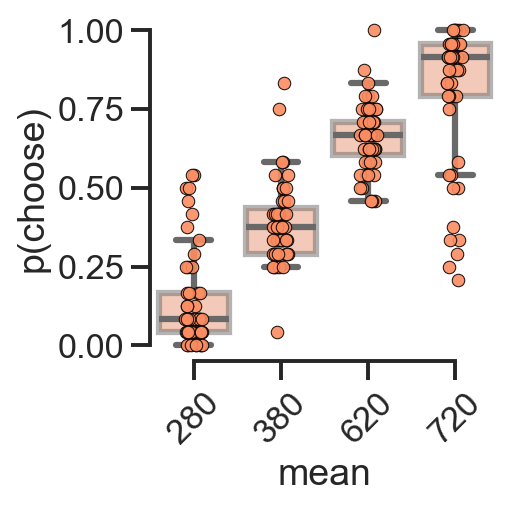

In [ ]:
import matplotlib.pyplot as plt

session = [2]
df['id'] = df.prolificID
dff = df[df.expName==expName].copy()
# dff = dff[dff.t > 25]
dff = dff[dff.session.isin(session)]    
dff = dff[dff.group!='random']

mm = np.unique(np.array([dff.m1.unique(), dff.m2.unique()]).flatten())
p_freq = []
m_freq = []
for pid in dff.id.unique():
    ddf = dff[(dff.id == pid)]
    
    for m in mm:
        n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
        m_freq.append(
            {
              'id': pid,
             'm': m,
             'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
             'N_m': n_m,
             'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
            }
        ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(3, 3), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, color='C1', boxprops=dict(alpha=0.5), zorder=-1, linewidth=3)   

sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, color="C1")

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('mean')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')

In [ ]:
data_rolling2.t.max()

142.0


Rolling stats shape: (48, 4)
Trial range: 3.0 to 144.0


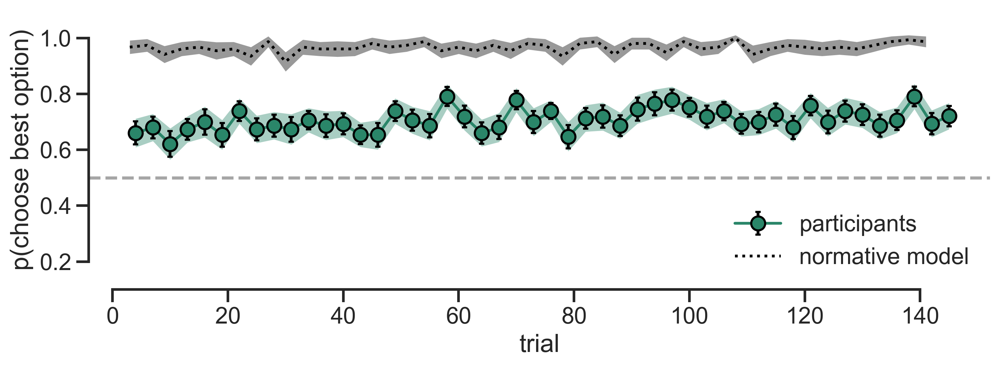

In [31]:
# Simple rolling average approach - no custom binning needed
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df_sim = pd.read_csv('df_sim.csv')
df_sim = df_sim[(df_sim.session==3) & (df_sim.pair.isin([0,1])) & (df_sim.group!='random')].sort_values('t').copy()
df_sim['t'] = df_sim.groupby('prolificID').cumcount()
df_sim['model'] = 'normative'
# Your existing filtering
data = df[(df.expName.isin(['FullPilot12'])) & (df.session==3) & (df.pair.isin([0,1])) & (df.group!='random')].sort_values('t').copy()
data['t'] = data.groupby('prolificID').cumcount()
data['model'] = 'human'
data = pd.concat([data, df_sim])
# data = data[data.model=='human']
# Calculate rolling means per subject, then average across subjects
bin_size = 3


# Group by subject and apply rolling mean
data_rolling = data[data.model=='human'].groupby(['prolificID'])[['t', 'opti_ff', 'opti_ss', 'opti_ev']].rolling(
    window=bin_size, 
    center=True,
    min_periods=1,
).mean().reset_index()

data_rolling2 = data[data.model=='normative'].groupby(['prolificID'])[['t', 'opti_ev']].rolling(
    window=bin_size,
    center=True,
    min_periods=1,
).mean().reset_index()

# now add data_rolling2 to data_rolling but opti_ev is renamed to normative_model
data_rolling = data_rolling.merge(data_rolling2[['prolificID', 't', 'opti_ev']], on=['prolificID', 't'], suffixes=('', '_normative'))   



# Select every 5th trial
stats_ff = data_rolling[data_rolling['t'] % bin_size == 0].groupby('t')['opti_ff'].agg(['mean', 'sem', 'std']).reset_index()
stats_ss = data_rolling[data_rolling['t'] % bin_size == 0].groupby('t')['opti_ss'].agg(['mean', 'sem', 'std']).reset_index()
stats_ev = data_rolling[data_rolling['t'] % bin_size == 0].groupby('t')['opti_ev'].agg(['mean', 'sem', 'std']).reset_index()
# Append the mean of the last 5 rows as trial 144
stats_ff.loc[len(stats_ff)] = [144, stats_ff.tail(5)['mean'].mean(), stats_ff.tail(5)['sem'].mean(), stats_ff.tail(5)['std'].mean()]
stats_ss.loc[len(stats_ss)] = [144, stats_ss.tail(5)['mean'].mean(), stats_ss.tail(5)['sem'].mean(), stats_ss.tail(5)['std'].mean()]
stats_ev.loc[len(stats_ev)] = [144, stats_ev.tail(5)['mean'].mean(), stats_ev.tail(5)['sem'].mean(), stats_ev.tail(5)['std'].mean()]

print(f"\nRolling stats shape: {stats_ff.shape}")
print(f"Trial range: {stats_ff['t'].min()} to {stats_ff['t'].max()}")
stats_ff['t'] = stats_ff['t'] + 1
stats_ss['t'] = stats_ss['t'] + 1
stats_ev['t'] = stats_ev['t'] + 1
stats_normative = data_rolling[data_rolling['t'] % bin_size == 0].groupby('t')['opti_ev_normative'].agg(['mean', 'sem', 'std']).reset_index()
# Create the final plot with dots, error bars, and fill
plt.figure(figsize=(10.3, 4), dpi=300)
sns.set_context('talk')
# Colors for each condition
C0, C1, C2 = ('#2a8669', '#d23a00', '#0641c7')

colors = {'ff': C2, 'ss': C1, 'ev': C0, 'normative': 'C3'}
labels = {'ff': 'best shield', 'ss': 'best spaceship', 'ev': 'participants', 'normative': 'normative model'}


conds = ['ev', 'normative']
# Plot each condition with different linestyles and alpha
for stats, condition in [(stats_ff, 'ff'), (stats_ss, 'ss'), (stats_ev, 'ev'), (stats_normative, 'normative')]:
    if condition not in conds:
        continue
    color = colors[condition]
    label = labels[condition]
    
    # Set linestyle: dotted for ff and ss, solid for ev
    linestyle = '-' if condition in ['ff', 'ss', 'ev'] else ':' if condition == 'normative' else '-'
    
    # Set alpha: lower for ff and ss (0.5), normal for ev (1.0)
    alpha = .6 if condition in ['ff', 'ss'] else 1.0
    
    # Plot dots with SEM error bars and black edges
    if condition in ('ff', 'ss', 'normative'):
        color = {'ff': 'C2', 'ss': 'C1', 'normative': 'black'}[condition]
        plt.plot(stats['t'], stats['mean'], color=color, label=label, linewidth=2, linestyle=linestyle, alpha=alpha)
    else:
        # fmt = 'o' if 
        plt.errorbar(stats['t'], stats['mean'], yerr=stats['sem'], 
                 fmt='o', color=color, markersize=10, capsize=2, 
                 capthick=1, label=label, linewidth=2, linestyle=linestyle,
                 markeredgecolor='black', markeredgewidth=1.5, ecolor='black',
                 alpha=alpha)
    
    # Add SEM fill with alpha=0.2 (even more transparent for ff and ss)
    fill_alpha = 0.15 if condition in ['ff', 'ss'] else 0.4
    
    plt.fill_between(stats['t'], 
                     stats['mean'] - stats['sem'] - 0.01, 
                     stats['mean'] + stats['sem'] + 0.01, 
                     color=color, alpha=fill_alpha, linewidth=0)

# Add horizontal reference line
plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(choose best option)')
plt.xlabel('trial')

# Set x-axis ticks and y-axis limits
# plt.xticks(np.arange(0, 144, bin_size))
plt.ylim(.1, 1.1)
# plt.xticks(np.arange(5, 146, bin_size*2), np.arange(0, 145, bin_size*2))
handles, labels = plt.gca().get_legend_handles_labels()
# Add a legend
labels = labels[::-1]
# labels = [labels[1], labels[0], labels[2], labels[3]]
handles = handles[::-1]
# handles = [handles[1], handles[0], handles[2], handles[3]]
plt.legend(title='', loc='lower right', frameon=False, handles=handles, labels=labels)

sns.despine(trim=True)

plt.tight_layout()

Data shape after filtering: (8772, 27)
Unique trials: 172
Unique subjects: 51
Reduced from 172 to 34 time points


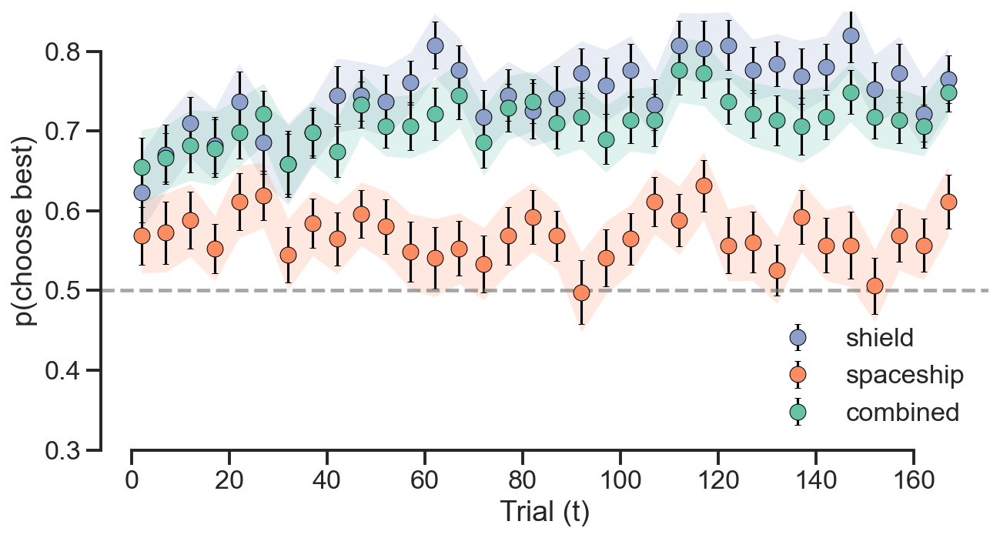


📊 MEAN PERFORMANCE:
Shield (C2): 0.747
Spaceship (C1): 0.567
Combined (C0): 0.712
✅ Plot now shows dots with error bars and reduced data points!


In [ ]:
# ========== FINAL PLOT WITH DOTS AND ERROR BARS ==========

# Filter and prepare data using df
data = df[(df.expName=='FullPilot12') & (df.session.isin([3])) & (df.group!='random')].\
groupby(['prolificID', 't'], as_index=False).mean(numeric_only=True)
data = data.sort_values('t').copy()

print(f"Data shape after filtering: {data.shape}")
print(f"Unique trials: {data['t'].nunique()}")
print(f"Unique subjects: {data['prolificID'].nunique()}")

# Create binned data by averaging every 3 trials to reduce from 172 to ~57 points
def bin_trials(data, bin_size=3):
    """Bin trials by averaging every bin_size trials"""
    binned_data = []
    for subject in data['prolificID'].unique():
        subject_data = data[data['prolificID'] == subject].copy()
        subject_data = subject_data.sort_values('t')
        
        # Create bins
        n_trials = len(subject_data)
        n_bins = n_trials // bin_size
        
        for i in range(n_bins):
            start_idx = i * bin_size
            end_idx = min((i + 1) * bin_size, n_trials)
            bin_data = subject_data.iloc[start_idx:end_idx]
            
            # Calculate mean values for this bin
            binned_trial = {
                'prolificID': subject,
                't_bin': i * bin_size + bin_size // 2,  # center of bin
                'opti_ff': bin_data['opti_ff'].mean(),
                'opti_ss': bin_data['opti_ss'].mean(),
                'opti_ev': bin_data['opti_ev'].mean()
            }
            binned_data.append(binned_trial)
    
    return pd.DataFrame(binned_data)

# Create binned dataset
data_binned = bin_trials(data, bin_size=5)
print(f"Reduced from {data['t'].nunique()} to {data_binned['t_bin'].nunique()} time points")

# Calculate means, SEM, and STD for each condition and time bin
def calculate_stats(data, y_col):
    stats = data.groupby('t_bin')[y_col].agg(['mean', 'sem', 'std']).reset_index()
    return stats

stats_ff = calculate_stats(data_binned, 'opti_ff')
stats_ss = calculate_stats(data_binned, 'opti_ss')
stats_ev = calculate_stats(data_binned, 'opti_ev')

# Create the final plot with dots, error bars, and fill
plt.figure(figsize=(9, 5))

# Colors for each condition
colors = {'ff': 'C2', 'ss': 'C1', 'ev': 'C0'}
labels = {'ff': 'shield', 'ss': 'spaceship', 'ev': 'combined'}

# Plot each condition
for stats, condition in [(stats_ff, 'ff'), (stats_ss, 'ss'), (stats_ev, 'ev')]:
    color = colors[condition]
    label = labels[condition]
    
    # Plot dots with SEM error bars and black edges
    plt.errorbar(stats['t_bin'], stats['mean'], yerr=stats['sem'], 
                 fmt='o', color=color, markersize=10, capsize=2, 
                 capthick=1, label=label, linewidth=1.5, 
                 markeredgecolor='black', markeredgewidth=0.5, ecolor='black')
    
    # Add SEM fill with alpha=0.3
    plt.fill_between(stats['t_bin'], 
                     stats['mean'] - stats['sem'] - 0.01, 
                     stats['mean'] + stats['sem'] + 0.01, 
                     color=color, alpha=0.2, linewidth=0)

# Add horizontal reference line
plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(choose best)')
plt.xlabel('Trial (t)')

# Set x-axis ticks and y-axis limits
plt.xticks(np.arange(0, 172, 20))
plt.ylim(0.3, 0.85)

# Add a legend
plt.legend(title='', loc='lower right', frameon=False)

# plt.title('Combination phase - Binned by 3 trials')
sns.despine(trim=True)

plt.tight_layout()
plt.show()

# Add mean values at the end for all three conditions
mean_ss = data.groupby(['prolificID'])['opti_ss'].mean().mean()
mean_ff = data.groupby(['prolificID'])['opti_ff'].mean().mean()
mean_ev = data.groupby(['prolificID'])['opti_ev'].mean().mean()

print(f"\n📊 MEAN PERFORMANCE:")
print(f"Shield (C2): {mean_ff:.3f}")
print(f"Spaceship (C1): {mean_ss:.3f}")
print(f"Combined (C0): {mean_ev:.3f}")

print("✅ Plot now shows dots with error bars and reduced data points!")

In [ ]:
# METHODS TO PLOT FEWER DATAPOINTS FOR CLEANER GRAPHS

# Method 1: Subsample every nth point
def subsample_data(data, n_points=20):
    """Subsample data to show only n_points across the time range"""
    max_t = data['t'].max()
    min_t = data['t'].min()
    step = (max_t - min_t) / (n_points - 1)
    target_times = [min_t + i * step for i in range(n_points)]
    
    # Find the closest actual time points to our target times
    sampled_data = []
    for target_t in target_times:
        closest_t = data.iloc[(data['t'] - target_t).abs().argsort()[:1]]['t'].iloc[0]
        sampled_data.append(data[data['t'] == closest_t])
    
    return pd.concat(sampled_data).drop_duplicates().sort_values('t')

# Method 2: Use every nth time point directly
def every_nth_point(data, n=5):
    """Take every nth time point"""
    unique_times = sorted(data['t'].unique())
    selected_times = unique_times[::n]  # Every nth time point
    return data[data['t'].isin(selected_times)]

# Method 3: Use specific time intervals (e.g., every 10 or 20 time units)
def time_intervals(data, interval=10):
    """Select data at regular time intervals"""
    max_t = data['t'].max()
    selected_times = list(range(0, int(max_t) + 1, interval))
    return data[data['t'].isin(selected_times)]

# Method 4: Bin and average data over time windows
def bin_and_average(data, n_bins=15):
    """Bin the time data and average within each bin"""
    data = data.copy()
    max_t = data['t'].max()
    min_t = data['t'].min()
    
    # Create bins
    bins = np.linspace(min_t, max_t, n_bins + 1)
    data['t_bin'] = pd.cut(data['t'], bins, labels=False, include_lowest=True)
    
    # Calculate bin centers for x-axis
    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    # Group by bin and calculate means
    grouped = data.groupby(['t_bin', 'expName', 'session', 'group']).agg({
        'opti_ss': 'mean',
        'opti_ff': 'mean', 
        'opti_ev': 'mean'
    }).reset_index()
    
    # Add bin centers as the new time variable
    grouped['t'] = grouped['t_bin'].map(dict(enumerate(bin_centers)))
    
    return grouped

print("Datapoint reduction methods defined!")
print("Original data shape:", data_sorted.shape)
print("Unique time points:", len(data_sorted['t'].unique()))

Datapoint reduction methods defined!
Original data shape: (8772, 35)
Unique time points: 172


In [ ]:
# ADDITIONAL TIPS FOR CLEANER PLOTS

# Tip 1: Use markers sparingly - only show every nth marker
def plot_with_sparse_markers(data, marker_interval=3):
    """Plot with markers only at every nth point"""
    # Create marker data (subset of points)
    unique_times = sorted(data['t'].unique())
    marker_times = unique_times[::marker_interval]
    marker_data = data[data['t'].isin(marker_times)]
    
    # Plot main lines without markers
    sns.lineplot(x='t', y='opti_ff_smoothed', data=data, color='C2', linewidth=2, label='shield', errorbar='se')
    sns.lineplot(x='t', y='opti_ss_smoothed', data=data, color='C1', linewidth=2, label='spaceship', errorbar='se')
    sns.lineplot(x='t', y='opti_ev_smoothed', data=data, color='C0', linewidth=2, label='true', errorbar='se')
    
    # Add markers only at specific points
    sns.scatterplot(x='t', y='opti_ff_smoothed', data=marker_data, color='C2', s=30, marker='o')
    sns.scatterplot(x='t', y='opti_ss_smoothed', data=marker_data, color='C1', s=30, marker='s')
    sns.scatterplot(x='t', y='opti_ev_smoothed', data=marker_data, color='C0', s=30, marker='^')

# Tip 2: Focus on key time periods
def plot_key_periods(data, periods=[(0, 50), (100, 150)]):
    """Plot only specific time periods of interest"""
    fig, axes = plt.subplots(1, len(periods), figsize=(12, 4))
    
    for i, (start, end) in enumerate(periods):
        period_data = data[(data['t'] >= start) & (data['t'] <= end)]
        ax = axes[i] if len(periods) > 1 else axes
        
        sns.lineplot(x='t', y='opti_ff_smoothed', data=period_data, color='C2', linewidth=2, label='shield', errorbar='se', ax=ax)
        sns.lineplot(x='t', y='opti_ss_smoothed', data=period_data, color='C1', linewidth=2, label='spaceship', errorbar='se', ax=ax)
        sns.lineplot(x='t', y='opti_ev_smoothed', data=period_data, color='C0', linewidth=2, label='true', errorbar='se', ax=ax)
        
        ax.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
        ax.set_title(f'Time Period: {start}-{end}')
        ax.set_ylim(0.4, 0.9)
        if i == 0:
            ax.legend()
    
    plt.tight_layout()

print("Additional plotting techniques available:")
print("1. plot_with_sparse_markers() - Show markers only at key points")
print("2. plot_key_periods() - Focus on specific time periods")
print("3. Consider using rolling averages with larger windows for smoother trends")
print("4. Use alpha transparency to show uncertainty without cluttering")

# Quick example of the sparse markers approach
plt.figure(figsize=(8, 3))
plot_with_sparse_markers(data_clean, marker_interval=4)
plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(optimal)')
plt.ylim(0.4, 0.9)
plt.legend(loc='lower right')
plt.title('Plot with Sparse Markers')
sns.despine(trim=True)
plt.tight_layout()
plt.show()

(0.0, 1.0)

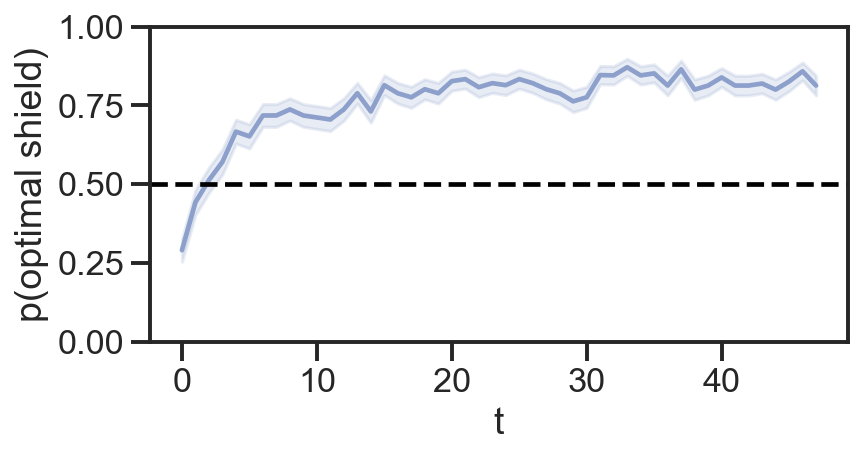

In [ ]:
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150}) 
sns.set_palette('Set2')
sns.set_style('ticks') 
sns.set_context('talk')
plt.subplot(2, 1, 1)
ddf = df[df.group!='random']
sns.lineplot(x='t', y='opti_ff', data=df[(df.session==1) & (df.group!='random')], color='C2', errorbar=('se'))
plt.axhline(y=0.5, color='black', linestyle='--')
plt.ylabel('p(optimal shield)')
plt.ylim(0,1)


# now plot means for opti_ff


session
0    0.637295
1    0.681148
2    0.773406
Name: opti, dtype: float64


C:\Users\garciaba\AppData\Local\Temp\ipykernel_31244\2550041353.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='session', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=.5),  zorder=-1, linewidth=3, palette=['C1', 'C2', 'C1'], meanline=True)
C:\Users\garciaba\AppData\Local\Temp\ipykernel_31244\2550041353.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='session', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C1'])


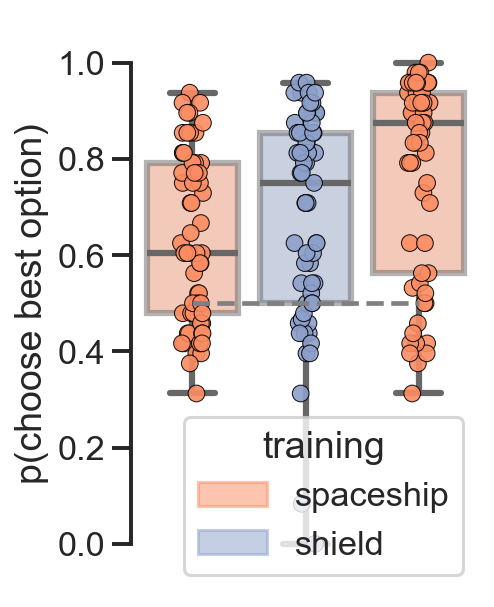

In [ ]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2

sns.set(rc={'figure.figsize':(3, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([0,1, 2])]
ddf = ddf[ddf.expName.isin(['FullPilot12'])]

# ddf['exp'] = 1
# ddf['opti'] = np.nan
# ddf = ddf[ddf.group!='random']  
# create a new dataframe with id, opti_ss, opti_ff, session
ddf.loc[ddf.session.isin([0,2]), 'opti'] = ddf[ddf.session.isin([0,2])].opti_ss
ddf.loc[ddf.session == 1, 'opti'] = ddf[ddf.session == 1].opti_ff

# session 0 and 2 becomes session 0 with average of opti 0 and 2
# def average_opti(x):
    # for each t and prolificID, return the mean of opti
    # return np.mean(ddf[(ddf.session.isin([0, 2])) & (ddf.prolificID == x.prolificID) & (ddf.t == x.t)].opti)

# ddf['opti'] = ddf.apply(lambda x: average_opti(x) if x.session in [0, 1, 2] else x.opti, axis=1)

# now drop session 2
# ddf = ddf[ddf.session != 2]




ddf = ddf.groupby(['prolificID', 'session'], as_index=False).opti.mean()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>28]
print(ddf.groupby('session').opti.mean())

ax = sns.boxplot(x='session', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=.5),  zorder=-1, linewidth=3, palette=['C1', 'C2', 'C1'], meanline=True)
# Apply alpha only to the fill (facecolor), keep edge opaque

sns.stripplot(x='session', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C1'])

plt.ylabel('p(choose best option)')
plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--')
sns.despine(trim=True, bottom=True)
plt.ylim(0, 1)
plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
plt.ylim(-.1, 1.1)

# orange is "spaceship training"
# blue is "shield training"
# import patch
import matplotlib.patches as Patch
handles = [
   Patch.Patch(color='C1', label='spaceship', alpha=0.5),
    Patch.Patch(color='C2', label='shield', alpha=0.5),
]

plt.legend(title='training', handles=handles, loc='lower right')

In [ ]:
df[(df.group=='random') & (df.expName=='FullPilot12')].prolificID.nunique()

10

session
0    0.637295
1    0.681148
2    0.773406
Name: opti, dtype: float64


c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\raincloudpy\raincloud.py:161: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


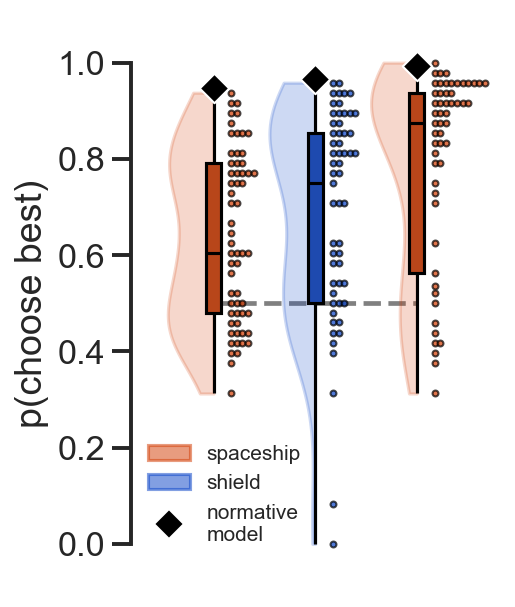

In [28]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2

sns.set(rc={'figure.figsize':(3, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

ddf = df.copy()

ddf = ddf[ddf.session.isin([0,1, 2])]
ddf = ddf[ddf.expName.isin(['FullPilot12']) ]
# ddf = ddf[ddf.group!='random']

# create a new dataframe with id, opti_ss, opti_ff, session
ddf.loc[ddf.session.isin([0,2]), 'opti'] = ddf[ddf.session.isin([0,2])].opti_ss
ddf.loc[ddf.session == 1, 'opti'] = ddf[ddf.session == 1].opti_ff


ddf = ddf.groupby(['prolificID', 'session'], as_index=False).opti.mean()

print(ddf.groupby('session').opti.mean())
model = pd.read_csv('df_sim.csv')
model = model[(model.session.isin([0,1,2]))]
model.loc[model.session.isin([0,2]), 'opti'] = model[model.session.isin([0,2])].opti_ss
model.loc[model.session == 1, 'opti'] = model[model.session == 1].opti_ff
normative_means = model.groupby(['session'], as_index=False).opti.mean()
C0, C1, C2 = ('#2a8669', '#d23a00', '#0641c7')

from raincloudpy import raincloudplot
raincloudplot(
    x='session', y='opti', data=ddf, 
    palette=[C1, C2, C1], dot_size=8, dot_spacing=0.055,
    box_kwargs={'color':'black', 'linecolor': 'black', 'linewidth':1.5},
    box_dots_spacing=0.1, y_threshold=0.01, violin_width=0.45,
)
# normative means
plt.scatter(x=[0, 1, 2], y=normative_means.opti, color='black', s=100, marker='D',
             label='normative', zorder=10, linewidth=1, edgecolor='white')
plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--', zorder=-100)
sns.despine(trim=True, bottom=True, offset=10)
plt.ylim(0, 1)
plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.ylabel('p(choose best)')
# plt.xticks([0, 1, 2], ['spaceship\ntraining', 'shield\ntraining', 'spaceship\ntraining'])
plt.xticks([])
plt.ylim(-.1, 1.1)
plt.tick_params(axis='x', which='both', length=0)

# orange is "spaceship training"
# blue is "shield training"
# import patch
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

handles = [
    mpatches.Patch(color=C1, label='spaceship', alpha=0.5),
    mpatches.Patch(color=C2, label='shield', alpha=0.5),
    # Use Line2D for the diamond marker
    mlines.Line2D([0], [0], marker='D', color='w', label='normative\nmodel', 
           markerfacecolor='black', markeredgecolor='white', 
           markersize=10, markeredgewidth=1)
]

plt.legend(title='', handles=handles, loc='lower right', fontsize=10, bbox_to_anchor=(0.48, 0.05), frameon=False)

In [ ]:
import pingouin as pg
ddf['opti'] = ddf['opti'].astype(float)  # Convert boolean to numeric (True->1.0, False->0.0)

pg.pairwise_tests(data=ddf, dv='opti', between='session', parametric=True, padjust='bonf')

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,session,0,1,False,True,-1.216636,120.0,two-sided,0.226130,0.678390,bonf,0.376,-0.218918
1,session,0,2,False,True,-3.910444,120.0,two-sided,0.000153,0.000459,bonf,148.741,-0.703635
2,session,1,2,False,True,-2.380091,120.0,two-sided,0.018884,0.056651,bonf,2.42,-0.428267


var
ev    0.671121
ff    0.693989
ss    0.551133
Name: opti, dtype: object


C:\Users\basil\AppData\Local\Temp\ipykernel_34840\2772345309.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(order=order, x='var', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=.5),  zorder=-1, linewidth=3, palette=['C1', 'C2', 'C0'], meanline=True)
C:\Users\basil\AppData\Local\Temp\ipykernel_34840\2772345309.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(order=order, x='var', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C0'])


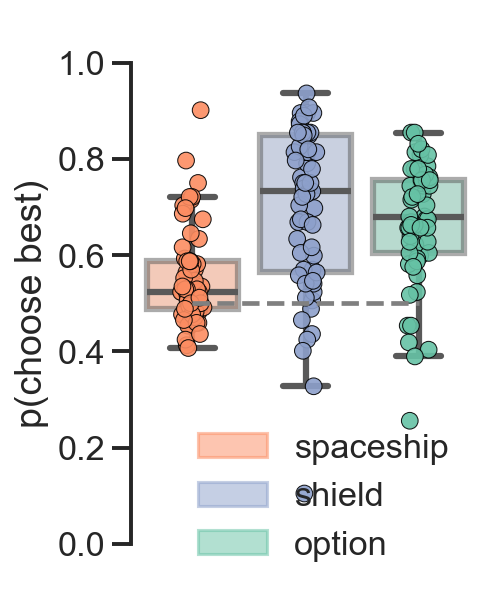

In [ ]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2

sns.set(rc={'figure.figsize':(3, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([3])]
ddf = ddf[ddf.expName.isin(['FullPilot12'])]

# create a column named var that is either ss, ff, or ev
# the column value is named by opti
# Melt the dataframe to create 'var' and 'opti' columns
df_melted = ddf.melt(
    id_vars=[col for col in ddf.columns if col not in ['opti_ss', 'opti_ff', 'opti_ev']], 
    value_vars=['opti_ss', 'opti_ff', 'opti_ev'],
    var_name='var', 
    value_name='opti'
)

# Clean up the 'var' column to remove 'opti_' prefix
df_melted['var'] = df_melted['var'].str.replace('opti_', '')

# If you want to replace the original df:
# df = df_melted

ddf = df_melted.groupby(['prolificID', 'session', 'var'], as_index=False).opti.mean()

print(ddf.groupby('var').opti.mean())
order = ['ss', 'ff', 'ev']
ax = sns.boxplot(order=order, x='var', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=.5),  zorder=-1, linewidth=3, palette=['C1', 'C2', 'C0'], meanline=True)
# Apply alpha only to the fill (facecolor), keep edge opaque

sns.stripplot(order=order, x='var', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C0'])

plt.ylabel('p(choose best)')
plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--')
# sns.despine(trim=True, bottom=True)
plt.ylim(0, 1)
plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
plt.ylim(-.1, 1.1)
sns.despine(trim=True, bottom=True)
# orange is "spaceship training"
# blue is "shield training"
# import patch
import matplotlib.patches as Patch
handles = [
   Patch.Patch(color='C1', label='spaceship', alpha=0.5),
    Patch.Patch(color='C2', label='shield', alpha=0.5),
    Patch.Patch(color='C0', label='option', alpha=0.5)
]

plt.legend(title='', handles=handles, loc='lower right', frameon=False)

var
ev    0.704699
Name: opti, dtype: float64


c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\raincloudpy\raincloud.py:161: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


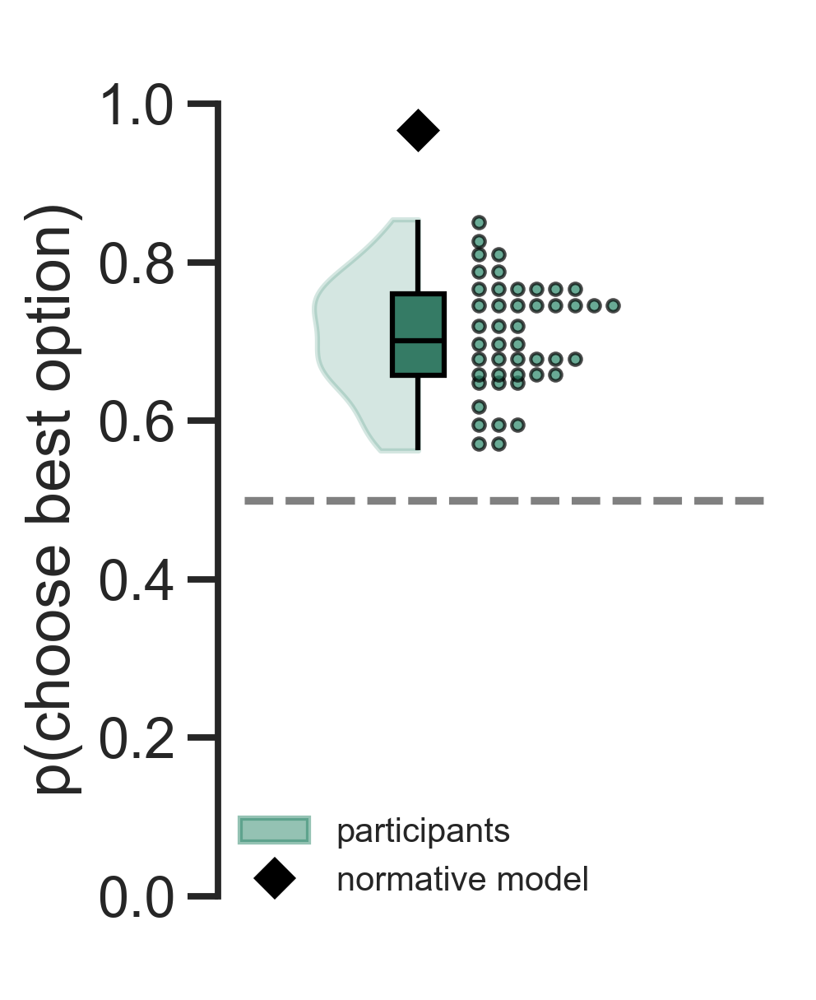

In [27]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2



ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([3])]
ddf = ddf[ddf.expName.isin(['FullPilot12']) & (ddf.group!='random') & (ddf.pair.isin([0,1]))]

# create a column named var that is either ss, ff, or ev
# the column value is named by opti
# Melt the dataframe to create 'var' and 'opti' columns
df_melted = ddf.melt(
    id_vars=[col for col in ddf.columns if col not in ['opti_ss', 'opti_ff', 'opti_ev']], 
    value_vars=['opti_ss', 'opti_ff', 'opti_ev'],
    var_name='var', 
    value_name='opti'
)

# Clean up the 'var' column to remove 'opti_' prefix
df_melted['var'] = df_melted['var'].str.replace('opti_', '')

# If you want to replace the original df:
# df = df_melted
model = pd.read_csv('df_sim.csv')
model = model[(model.session==3) & (model.pair.isin([0,1]))]
# melt model as with df_melted
model_melted = model.melt(
    id_vars=[col for col in model.columns if col not in ['opti_ss', 'opti_ff', 'opti_ev']], 
    value_vars=['opti_ss', 'opti_ff', 'opti_ev'],  
    var_name='var', 
    value_name='opti')
# get the means for each var
var_means_normative = model_melted.groupby('var').opti.mean()
# select only ev
var_means_normative = var_means_normative[var_means_normative.index=='opti_ev']
ddf = df_melted.groupby(['prolificID', 'session', 'var'], as_index=False).opti.mean().astype({'opti': float})
# drop where var is not 'ev'
ddf = ddf.query("var == 'ev'")
print(ddf.groupby('var').opti.mean())
order = ['ss', 'ff', 'ev']
order = ['ev']

plt.figure(figsize=(3, 5), dpi=300)
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from raincloudpy import raincloudplot
plt.plot([-0.5, 1], [0.5, 0.5], color='grey', linestyle='--', zorder=-1000)
C0, C1, C2 = ('#2a8669', '#d23a00', '#0641c7')

raincloudplot(
    x='var', y='opti', data=ddf[ddf.session==3], 
    palette=[C0], dot_size=12, dot_spacing=0.055, box_width=0.15, 
    box_kwargs={'color':'black', 'linecolor': 'black', 'linewidth':1.5},
    box_dots_spacing=0.1, y_threshold=0.015, violin_width=0.3,
)

plt.scatter(x=[0], y=var_means_normative.values,
             color='black', s=100, marker='D', label='normative model', zorder=10, edgecolor='white', linewidth=1)
plt.ylabel('p(choose best option)')
# sns.despine(trim=True, bottom=True)
plt.ylim(0, 1)
plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
plt.ylim(-.1, 1.1)
sns.despine(trim=True, bottom=True)
# orange is "spaceship training"
# blue is "shield training"
# import patch
# import matplotlib.patches as mpatches
# import matplotlib.lines as mlines

handles = [
    # mpatches.Patch(color='C2', label='shield', alpha=0.5),

    # mpatches.Patch(color='C1', label='spaceship', alpha=0.5),
    mpatches.Patch(color=C0, label='participants', alpha=0.5),
    # Use Line2D for the diamond marker
    mlines.Line2D([0], [0], marker='D', color='w', label='normative model', 
           markerfacecolor='black', markeredgecolor='white', 
           markersize=10, markeredgewidth=1)
]
plt.legend(title='', handles=handles, loc='lower right', frameon=False, fontsize=10, bbox_to_anchor=(0.7, 0.05))

var
ff    0.746922
ss    0.567145
Name: opti, dtype: float64


c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\raincloudpy\raincloud.py:161: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


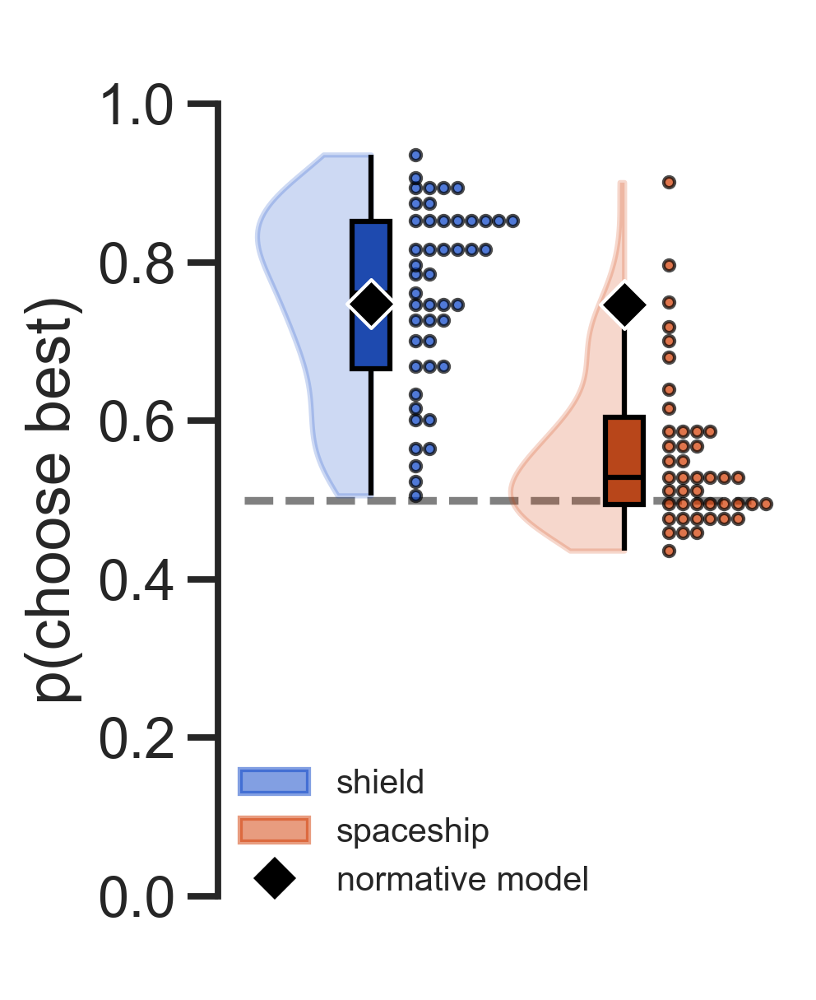

In [26]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2



ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([3])]
ddf = ddf[ddf.expName.isin(['FullPilot12']) & (ddf.group!='random')]

# create a column named var that is either ss, ff, or ev
# the column value is named by opti
# Melt the dataframe to create 'var' and 'opti' columns
df_melted = ddf.melt(
    id_vars=[col for col in ddf.columns if col not in ['opti_ss', 'opti_ff', 'opti_ev']], 
    value_vars=['opti_ss', 'opti_ff', 'opti_ev'],
    var_name='var', 
    value_name='opti'
)

# Clean up the 'var' column to remove 'opti_' prefix
df_melted['var'] = df_melted['var'].str.replace('opti_', '')

# If you want to replace the original df:
# df = df_melted
model = pd.read_csv('df_sim.csv')
model = model[(model.session==3) & (model.pair.isin([0,1]))]
# melt model as with df_melted
model_melted = model.melt(
    id_vars=[col for col in model.columns if col not in ['opti_ss', 'opti_ff', 'opti_ev']], 
    value_vars=['opti_ss', 'opti_ff', 'opti_ev'],  
    var_name='var', 
    value_name='opti')
# get the means for each var
var_means_normative = model_melted.groupby('var').opti.mean()
# select only ev
var_means_normative = var_means_normative[var_means_normative.index!='opti_ev']
ddf = df_melted.groupby(['prolificID', 'session', 'var'], as_index=False).opti.mean().astype({'opti': float})
# drop where var is not 'ev'
ddf = ddf.query("var != 'ev'")
print(ddf.groupby('var').opti.mean())
order = ['ss', 'ff', 'ev']
order = ['ff', 'ss']
C0, C1, C2 = ('#2a8669', '#d23a00', '#0641c7')
plt.figure(figsize=(3, 5), dpi=300)
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from raincloudpy import raincloudplot
plt.plot([-0.5, 1.5], [0.5, 0.5], color='grey', linestyle='--', zorder=-1000)

raincloudplot(
    x='var', y='opti', data=ddf[ddf.session==3], 
    palette=[C2, C1], dot_size=10, dot_spacing=0.055,
    box_kwargs={'color':'black', 'linecolor': 'black', 'linewidth':1.5},
    box_dots_spacing=0.1, y_threshold=0.015, violin_width=0.45,order=order
)

plt.scatter(x=[0, 1], y=var_means_normative.values,
             color='black', s=100, marker='D', label='normative model', zorder=10, edgecolor='white', linewidth=1)
plt.ylabel('p(choose best)')
# sns.despine(trim=True, bottom=True)
plt.ylim(0, 1)
plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
plt.ylim(-.1, 1.1)
sns.despine(trim=True, bottom=True)
# orange is "spaceship training"
# blue is "shield training"
# import patch
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

handles = [
    mpatches.Patch(color=C2, label='shield', alpha=0.5),

    mpatches.Patch(color=C1, label='spaceship', alpha=0.5),
    # mpatches.Patch(color='C0', label='participants', alpha=0.5),
    # Use Line2D for the diamond marker
    mlines.Line2D([0], [0], marker='D', color='w', label='normative model', 
           markerfacecolor='black', markeredgecolor='white', 
           markersize=10, markeredgewidth=1)
]
plt.legend(title='', handles=handles, loc='lower right', frameon=False, fontsize=10, bbox_to_anchor=(0.7, 0.05))

In [ ]:
import pingouin as pg
ddf['opti'] = ddf['opti'].astype(float)  # Convert boolean to numeric (True->1.0, False->0.0)

# pg.pairwise_tests(data=ddf, dv='opti', between='var', parametric=True, padjust='bonf')
import pingouin as pg

# For within-subjects pairwise tests
pg.pairwise_tests(data=ddf, dv='opti', within='var', subject='prolificID', 
                  parametric=True, padjust='bonf').round(6)

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,var,ev,ff,True,True,-1.981788,60.0,two-sided,0.05209,0.156269,bonf,0.87,-0.152348
1,var,ev,ss,True,True,8.027924,60.0,two-sided,0.00000,0.000000,bonf,2.185e+08,1.059964
2,var,ff,ss,True,True,5.689344,60.0,two-sided,0.00000,0.000001,bonf,3.693e+04,1.012818


C:\Users\garciaba\AppData\Local\Temp\ipykernel_29260\944777076.py:23: UserWarning: 
The palette list has fewer values (3) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.15, fill=True, palette=['C2', 'C0', 'C1'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001)
C:\Users\garciaba\AppData\Local\Temp\ipykernel_29260\944777076.py:26: UserWarning: 
The palette list has fewer values (3) than needed (4) and will cycle, which may produce an uninterpretable plot.
  scatter = sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group', palette=['C2', 'C0', 'C1'], s=100


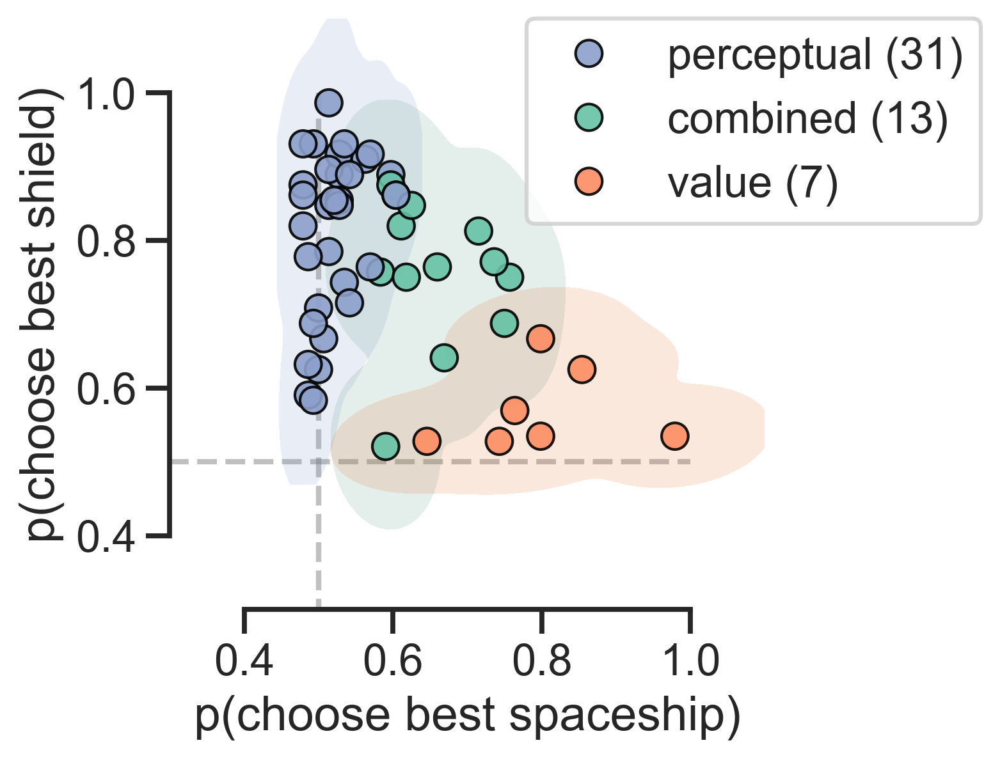

In [50]:
# same but with scatterplot

import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

df_ = df[(df.session==3) & (df.pair.isin([0,1])) & (df.group!='random') & (df.expName=='FullPilot12')].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.group!='random']
sns.set(rc={'figure.figsize':(4,4), 'figure.dpi': 300})
sns.set_context("talk")
sns.set_style("ticks")
sns.set_palette('Set2')

# sort by group 
order = ['perceptual', 'combined', 'value', 'random']
df_['group'] = pd.Categorical(df_['group'], categories=order, ordered=True)

# df_['opti_ss_training'] = df[(df.expName=='FullPilot14') & (df.session==2) & (df.group!='random')].groupby(['prolificID', 'group']).opti_ss.mean().values
# df_['opti_ff_training'] = df[(df.expName=='FullPilot14') & (df.session==1) & (df.group!='random')].groupby(['prolificID', 'group']).opti_ff.mean().values



# using seaborn, we want a region of interest using the colors of the clusters in scatterplot
sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.15, fill=True, palette=['C2', 'C0', 'C1'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001) 
# Draw kdeplot for clusters with sufficient points

scatter = sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group', palette=['C2', 'C0', 'C1'], s=100
, edgecolor='black', linewidth=1, alpha=0.9)

            

# add a third dimension (opti_ev)
plt.ylim(0.3, 1.1)
plt.xlim(0.3, 1.1)

# add identity line (x=y)
# plt.plot([0.3, 1], [0.3, 1], color='grey', lw=2, zorder=-100, alpha=0.5)

# add 0.5 line v and h
# plt.axhline(0.5, color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
# plt.axvline(0.5, color='grey', lw=2, ls='--', alpha=0.5 , zorder=-100)

plt.plot([0, 1], [.5, .5], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
plt.plot([.5, .5], [0, 1], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)

plt.xlabel('p(choose best spaceship)')
plt.ylabel('p(choose best shield)')
# put legend outside
# N = len(data)
# plt.title(f'counterfactual+R/2; N={N}')
sns.despine(trim=True)
#no legend
# plt.legend().remove()

#
# use order for legend
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['perceptual', 'combined', 'value']
handles = [handles[order.index(label)] for label in labels]
labels = [f'{label} ({len(df_[df_.group==label])})' for label in labels]
plt.legend(title='', bbox_to_anchor=(0.6, 1), labels=labels, handles=handles,
           loc=2, borderaxespad=0.)

# legend order
# plt.legend().remove()

# RISK
normative model = risky at .75 frequency


In [34]:
# load risk tests
#select prolificIDs
dd = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0,1]))]
pids = dd.prolificID.unique()

# now go get these prolificIDs from the risk tests
dospert = pd.read_csv('../data/raw/test/spaceprl_dospert(5).csv')
dospert = dospert[dospert.prolificID.isin(pids)]
# general = pd.read_csv('../data/raw/test/spaceprl_general_risk(2).csv')
# general = general[general.prolificID.isin(pids)]
feed = pd.read_csv('../data/raw/test/spaceprl_feedback(1).csv')
feed = feed[feed.prolificID.isin(pids)]
lot = pd.read_csv('../data/raw/test/spaceprl_risk(4).csv')
lot = lot[lot.prolificID.isin(pids)]

# lot is a holt and laury test with 10 choices (choice_0 to choice_9)
# compute risky choices
lot['risky_choices'] = lot[[f'choice_{i}' for i in range(10)]].sum(axis=1)
# lot = lot[['prolificID', 'risky_choices', 'amount']]
# compute dospert risk score as the sum of all columns except prolificID
dospert['risk_d'] = dospert[[f'q{i}' for i in range(0, 30)]].sum(axis=1)

# compute the average of q0 to q5 if the columns exist
# first map Strongly Disagree to 1, Disagree to 2, Neutral to 3, Agree to 4, Strongly Agree to 5
feed = feed.replace({'Strongly Disagree': 5, 'Disagree': 4, 'Neutral': 3, 'Agree': 2, 'Strongly Agree': 1})
# then compute the mean of q0 to q3 if the columns exist
feed['feedback'] = feed[[f'q{i}' for i in [0,1,2,3,4]]].mean(axis=1) / 5
# for participant that have NaN in q3 and q4, take q2 value, for the reste take q3 value
# feed['feedback'] = np.where(feed.q3.isna() & feed.q2.notna(), feed.q2, feed.q3)
# for participant that have NaN in q3 and q2, take mean of q0 and q1 value, for the reste take q0 to q2 value
# feed['feedback'] = np.where(feed.q3.isna() & feed.q2.isna(), feed[[f'q{i}' for i in [0,1]]].mean(axis=1), feed[[f'q{i}' for i in [0,1,2]]].mean(axis=1))
# finally, if feedback is NaN, replace it with the mean of the feedback
# create a new df called risk 
risk = pd.merge(lot, dospert, on='prolificID', how='outer')
risk = pd.merge(risk, feed[['prolificID', 'feedback']], on='prolificID', how='outer')
# add the chose_risky avg from dd to risk
risk = pd.merge(risk, df[df.expName.isin(['FullPilot12_2']) & (df.session==3) & (df.pair.isin([0,1]))].groupby('prolificID').chose_risky.mean().reset_index(), on='prolificID', how='left')
risk = pd.merge(risk, df[df.expName.isin(['FullPilot12_2']) & (df.session==3) & (df.pair.isin([0,1]))].groupby('prolificID').chose_safe.mean().reset_index(), on='prolificID', how='left')
# also add opti_ff
risk = pd.merge(risk, df[df.expName.isin(['FullPilot12_2']) & (df.session==3) & (df.pair.isin([0,1]))].groupby('prolificID').opti_ff.mean().reset_index(), on='prolificID', how='left')
# also add opti_ss
risk = pd.merge(risk, df[df.expName.isin(['FullPilot12_2']) & (df.session==3) & (df.pair.isin([0,1]))].groupby('prolificID').opti_ss.mean().reset_index(), on='prolificID', how='left')
risk = pd.merge(risk, df[df.expName.isin(['FullPilot12_2']) & (df.session==3) & (df.pair.isin([0,1]))].groupby('prolificID').opti_ev.mean().reset_index(), on='prolificID', how='left')
# remove 65707ef834f5c6af96da98ce
risk = risk[risk.prolificID != '65707ef834f5c6af96da98ce']

risk = pd.merge(risk, df[df.expName.isin(['FullPilot12_2']) & (df.session==3) & (df.pair.isin([0,1]))].groupby('prolificID').group.first().reset_index(), on='prolificID', how='left')

df_fit = pd.read_csv('../data/processed/omega_fit_full.csv')
risk['omega'] = df_fit[(df_fit.prolificID.isin(risk.prolificID))].groupby('prolificID').omega.last().reset_index(drop=True)
risk['beta'] = df_fit[df_fit.prolificID.isin(risk.prolificID)].groupby('prolificID').beta.last().reset_index(drop=True)

In [35]:
# melt lot into a new df called lot_melted with columns prolificID, choice, choice_number
lot_melted = pd.melt(lot, id_vars=['prolificID'], value_vars=[f'choice_{i}' for i in range(10)], var_name='choice_number', value_name='choice')
# convert choice_number to int 
lot_melted['choice_number'] = lot_melted['choice_number'].str.replace('choice_', '').astype(int)

risk['dospert'] = risk['risk_d'] / (30 * 7)


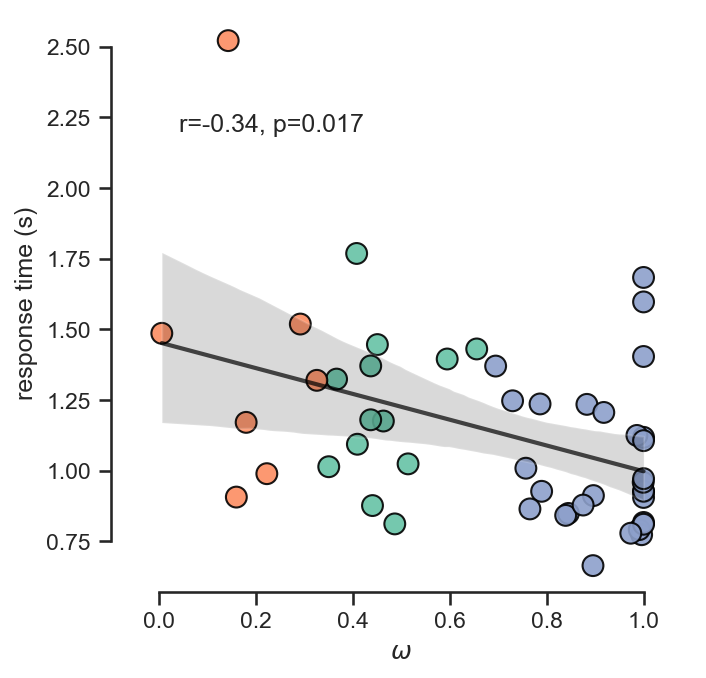

In [ ]:

# Filter data once
mask = (df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')
df_filtered = df[mask].groupby('prolificID').mean(numeric_only=True).sort_values('prolificID').reset_index()

# Get omega from model fits
avg = df_fit[(df_fit.exp=='FullPilot12_2') & (df_fit.model=='map') & (df_fit.group!='random')].sort_values('prolificID')

# Merge all data together
df_omega_opti = df_filtered[['prolificID', 'opti_ff', 'opti_ss', 'chose_risky', 'fireTime']].merge(
    avg[['prolificID', 'omega', 'group']], on='prolificID', how='inner'
).merge(
    risk[['prolificID', 'dospert', 'risky_choices']].sort_values('prolificID'), 
    on='prolificID', how='inner'
).rename(columns={'fireTime': 'rt', 'group': 'group2'})

df_omega_opti['risky_choices'] = df_omega_opti['risky_choices'].astype(float)/10
# change color of lmplot
colors = sns.color_palette("Set2")
sns.set({'figure.figsize': (5, 5), 'figure.dpi': 150})
sns.set_style('ticks')
sns.set_context('notebook')
sns.set_palette('Set2')
# sns.set_palette([colors[1]])
sns.scatterplot(x='omega', y='rt', data=df_omega_opti, hue='group2', palette=['C0', 'C2', 'C1'], s=100, edgecolor='black', linewidth=1, alpha=0.9)
plt.xlim(-0.1, 1.1)
# plt.ylim(-0.1, 1.1)

# add the regression black line in the background
sns.regplot(x='omega', y='rt', data=df_omega_opti, scatter=False, color='black', line_kws={'linewidth':2, 'alpha':0.7})
# pearson corr
import scipy.stats as stats


r, p = stats.spearmanr(df_omega_opti.omega, df_omega_opti.rt)

plt.text(0.04, 2.2, f'r={r:.2f}, p={p:.3f}')

plt.ylabel('response time (s)')
# plt.xlabel('p(choose best spaceship)')
plt.xlabel('$\omega$')

sns.despine(trim=True)
plt.legend().remove()

In [39]:
df_fit = pd.read_csv('../data/processed/omega_fit_full.csv')
df_fit.exp.unique()

group_map = {
    i:j for i in df.prolificID.unique() for j in df_fit[df_fit.prolificID==i].group
}
df['group'] = df.prolificID.map(group_map)
df.groupby(['expName', 'prolificID']).group.last().groupby('expName').value_counts()

expName        group     
FullPilot12    perceptual    31
               combined      13
               random        10
               value          7
FullPilot12_2  perceptual    30
               combined      13
               value          7
               random         5
FullPilot13    perceptual    22
               value         22
               random        15
               combined       5
FullPilot14    perceptual    29
               combined      20
               random        11
               value          5
Name: count, dtype: int64

In [ ]:
model = pd.read_csv('df_sim.csv')
model = model[(model.session==3) & (model.pair.isin([0,1])) & (model.expName.isin(['FullPilot12']))]
model['var1'] = model.p1 * (model.m1 - model.ev1)**2 + (1 - model.p1) * (0 - model.ev1)**2
model['var2'] = model.p2 * (model.m2 - model.ev2)**2 + (1 - model.p2) * (0 - model.ev2)**2

model['chose_risky'] = (model.var1 > model.var2) * (model.choice == 1) + (model.var2 > model.var1) * (model.choice == 2)
model.chose_risky.mean()

0.7470648580873134

N= 49


c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\raincloudpy\raincloud.py:161: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


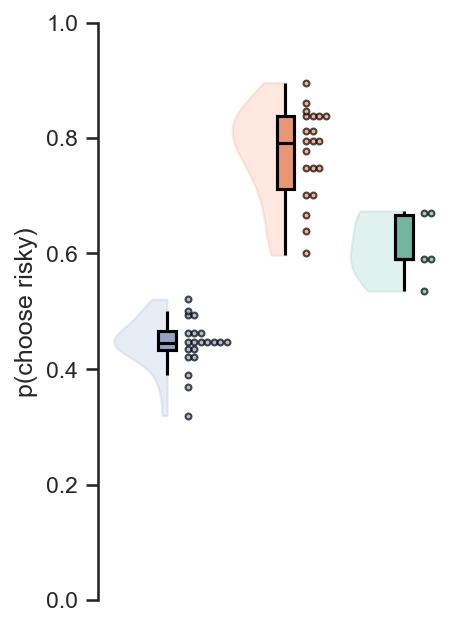

In [41]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2

sns.set(rc={'figure.figsize':(3, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('notebook')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([3]) & (ddf.pair.isin([0,1])) & (ddf.group!='random')]
ddf = ddf[ddf.expName.isin(['FullPilot13'])]
ddf = ddf.groupby(['prolificID', 'group'], as_index=False).chose_risky.mean().astype({'chose_risky': float})
ddf['rt'] = df[(df.session==3) & (df.pair.isin([0,1])) & (df.group!='random') & (df.expName.isin(['FullPilot12_2']))].groupby('prolificID').fireTime.mean().reset_index(drop=True)

print('N=',ddf.prolificID.nunique())


from raincloudpy import raincloudplot
# plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--', zorder=-1000)

raincloudplot(
    x='group', y='chose_risky', data=ddf, palette=['C2', 'C1', 'C0'],
    dot_size=8, dot_spacing=0.055,
    box_kwargs={'color':'black', 'linecolor': 'black', 'linewidth':1.5},
    box_dots_spacing=0.1, y_threshold=0.01, violin_width=0.45, order=['perceptual', 'value', 'combined']
)

# plot the means a big black dot
# plt.plot([2, 1, 0], [.75, .75, .75], color='black', label='normative model', zorder=-10, linestyle=':', linewidth=2.5)
plt.ylabel('p(choose risky)')
# sns.despine(trim=True, bottom=True)
plt.ylim(0, 1)
# plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
# plt.ylim(-.1, 1.1)
sns.despine(trim=True, bottom=True)
# orange is "spaceship training"
# blue is "shield training"
# import patch
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# handles = [
#     mpatches.Patch(color='C1', label='value', alpha=0.5),
#     mpatches.Patch(color='C2', label='perceptual', alpha=0.5),
#     mpatches.Patch(color='C0', label='combined', alpha=0.5),
#     # Use Line2D for the diamond marker

#     # mlines.Line2D([0], [0], label='normative model', linestyle=':', color='black', linewidth=2.5)
          
# ]
# plt.legend(title='', handles=handles, loc='lower right', frameon=False, fontsize=10, bbox_to_anchor=(0.7, 0.05))

N= 51


c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\raincloudpy\raincloud.py:161: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


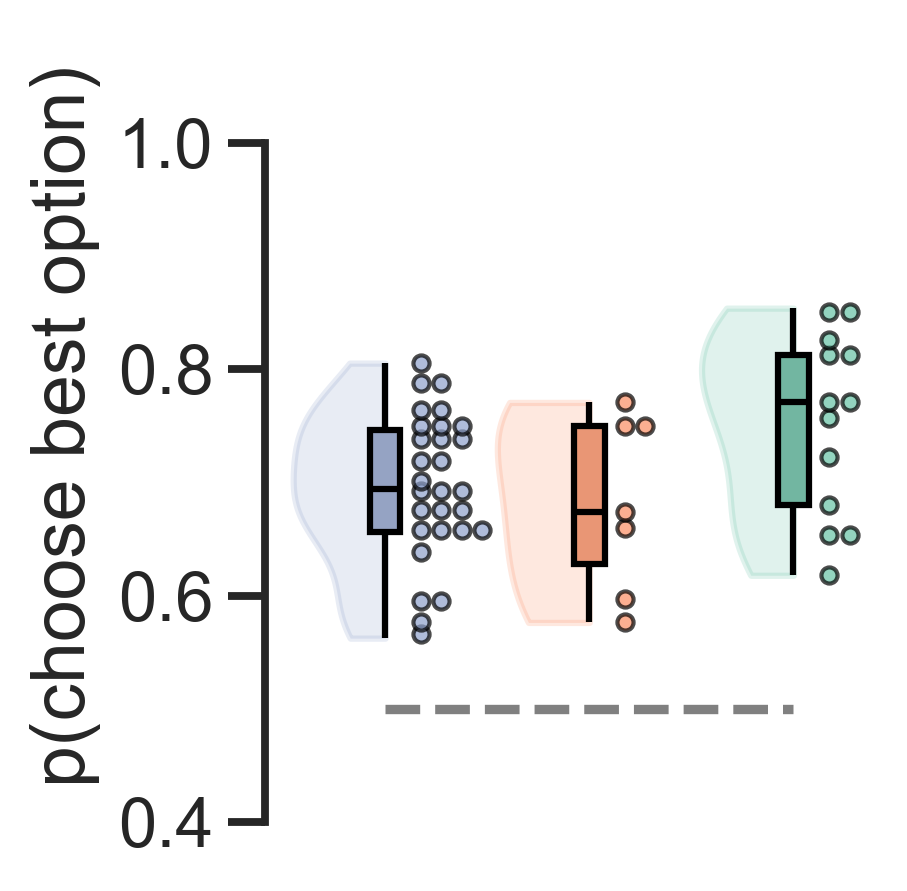

In [93]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2


ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([3]) & (ddf.pair.isin([0,1])) & (ddf.group!='random')]
ddf = ddf[ddf.expName.isin(['FullPilot12'])]
ddf = ddf.groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
# ddf['rt'] = df[(df.session==3) & (df.pair.isin([0,1])) & (df.group!='random') & (df.expName.isin(['FullPilot12_2']))].groupby('prolificID').fireTime.mean().reset_index(drop=True)

print('N=',ddf.prolificID.nunique())

plt.figure(figsize=(3, 3), dpi=300)
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from raincloudpy import raincloudplot
# plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--', zorder=-1000)

raincloudplot(
    x='group', y='opti_ev', data=ddf, palette=['C2', 'C1', 'C0'],
    dot_size=15, dot_spacing=0.1,
    box_kwargs={'color':'black', 'linecolor': 'black', 'linewidth':1.5},
    box_dots_spacing=0.1, y_threshold=0.01, violin_width=0.45, order=['perceptual', 'value', 'combined']
)

plt.plot([0, 1, 2], [0.5, 0.5, 0.5], color='grey', linestyle='--', zorder=-1000)

# plot the means a big black dot
# plt.plot([2, 1, 0], [.75, .75, .75], color='black', label='normative model', zorder=-10, linestyle=':', linewidth=2.5)
# sns.despine(trim=True, bottom=True)
plt.ylim(0.4, 1.1)
# plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])

plt.ylabel('p(choose best option)')
sns.despine(trim=True, bottom=True)

# Remove tight_layout() completely
# plt.tight_layout()

# Use subplots_adjust with a LARGER left margin
plt.gcf().subplots_adjust(left=0.30, right=0.98, top=0.98, bottom=0.10)
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
# because right now it is cut off
# handles = [
#     mpatches.Patch(color='C1', label='value', alpha=0.5),
#     mpatches.Patch(color='C2', label='perceptual', alpha=0.5),
#     mpatches.Patch(color='C0', label='combined', alpha=0.5),
#     # Use Line2D for the diamond marker

#     # mlines.Line2D([0], [0], label='normative model', linestyle=':', color='black', linewidth=2.5)
          
# ]
# plt.legend(title='', handles=handles, loc='lower right', frameon=False, fontsize=10, bbox_to_anchor=(0.7, 0.05))

In [95]:
# check that opti_ev is sig. different across groups
import pingouin as pg

pg.pairwise_tests(data=ddf, dv='opti_ff', between='group', parametric=True, padjust='bonf')

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,group,combined,perceptual,False,True,-1.603186,25.831941,two-sided,1.210524e-01,3.631571e-01,bonf,0.863,-0.490770
1,group,combined,value,False,True,5.514170,17.863956,two-sided,3.178445e-05,9.535335e-05,bonf,514.635,2.104904
2,group,perceptual,value,False,True,8.352595,19.012186,two-sided,8.737657e-08,2.621297e-07,bonf,9.065e+06,2.265148


N= 50


c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\raincloudpy\raincloud.py:161: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


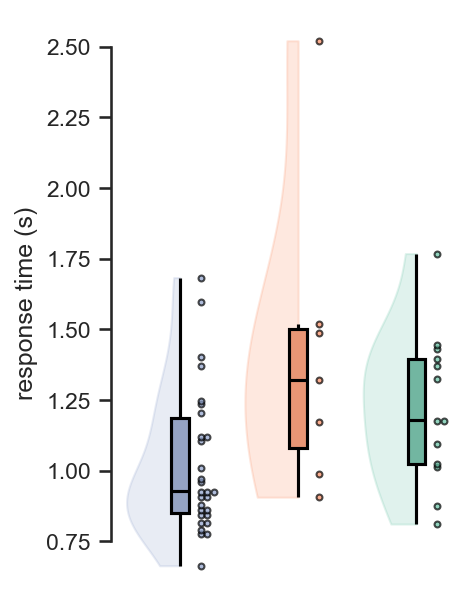

In [ ]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2

sns.set(rc={'figure.figsize':(3, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('notebook')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([3]) & (ddf.pair.isin([0,1])) & (ddf.group!='random')]
ddf = ddf[ddf.expName.isin(['FullPilot12_2'])]
ddf = ddf.groupby(['prolificID', 'group'], as_index=False).chose_risky.mean().astype({'chose_risky': float})
ddf['rt'] = df[(df.session==3) & (df.pair.isin([0,1])) & (df.group!='random') & (df.expName.isin(['FullPilot12_2']))].groupby('prolificID').fireTime.mean().reset_index(drop=True)

print('N=',ddf.prolificID.nunique())


from raincloudpy import raincloudplot
# plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--', zorder=-1000)

raincloudplot(
    x='group', y='rt', data=ddf, palette=['C2', 'C1', 'C0'],
    dot_size=8, dot_spacing=0.055,
    box_kwargs={'color':'black', 'linecolor': 'black', 'linewidth':1.5},
    box_dots_spacing=0.1, y_threshold=0.01, violin_width=0.45, order=['perceptual', 'value', 'combined']
)

# plot the means a big black dot
# plt.plot([2, 1, 0], [.75, .75, .75], color='black', label='normative model', zorder=-10, linestyle=':', linewidth=2.5)
plt.ylabel('response time (s)')
# sns.despine(trim=True, bottom=True)
# plt.ylim(0, 1)
# plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
# plt.ylim(-.1, 1.1)
sns.despine(trim=True, bottom=True)
# orange is "spaceship training"
# blue is "shield training"
# import patch
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# handles = [
#     mpatches.Patch(color='C1', label='value', alpha=0.5),
#     mpatches.Patch(color='C2', label='perceptual', alpha=0.5),
#     mpatches.Patch(color='C0', label='combined', alpha=0.5),
#     # Use Line2D for the diamond marker

#     # mlines.Line2D([0], [0], label='normative model', linestyle=':', color='black', linewidth=2.5)
          
# ]
# plt.legend(title='', handles=handles, loc='lower right', frameon=False, fontsize=10, bbox_to_anchor=(0.7, 0.05))

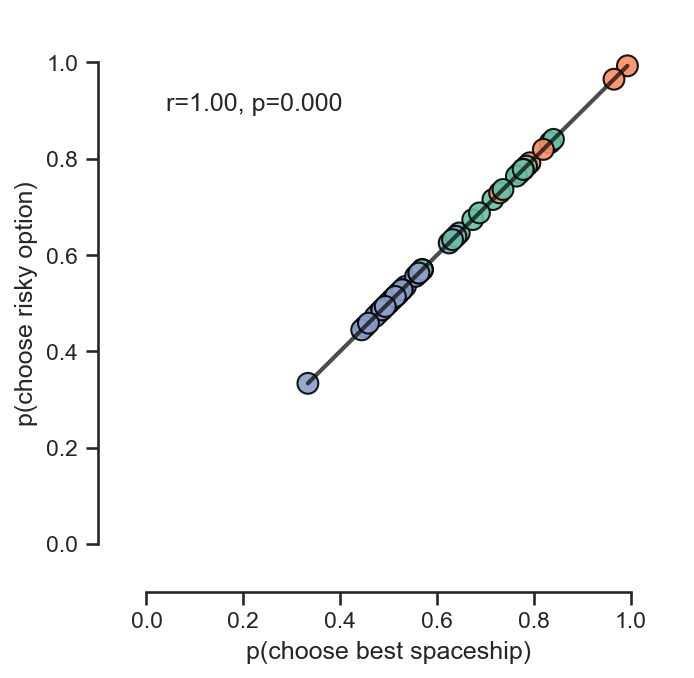

In [ ]:

avg = df_fit[(df_fit.exp=='FullPilot12_2') & (df_fit.model=='map') & (df_fit.group!='random')]\
# sort by prolificID
avg = avg.sort_values('prolificID')
omega = avg.omega.values
group = avg.group.values

# get opti_ss for FullPilot12
opti_ss = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')].groupby(['prolificID'])\
    .mean(numeric_only=True).sort_values('prolificID').reset_index().opti_ss.values
chose_risky = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')].groupby(['prolificID'])\
    .mean(numeric_only=True).sort_values('prolificID').reset_index().chose_risky.values
chose_risky = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')].groupby(['prolificID'])\
    .mean(numeric_only=True).sort_values('prolificID').reset_index().chose_risky.values

# create a dataframe with omega and opti_ss
df_omega_opti = pd.DataFrame({
    'omega': omega,
    'opti_ff': opti_ff,
    'opti_ss': opti_ss,
    'chose_risky': chose_risky,
    'group2': group
})

# change color of lmplot
colors = sns.color_palette("Set2")
sns.set({'figure.figsize': (5, 5), 'figure.dpi': 150})
sns.set_style('ticks')
sns.set_context('notebook')
sns.set_palette('Set2')
# sns.set_palette([colors[1]])
sns.scatterplot(x='opti_ss', y='chose_risky', data=df_omega_opti, hue='group2', palette=['C0', 'C2', 'C1'], s=100, edgecolor='black', linewidth=1, alpha=0.9)
plt.xlim(-0.1, 1.1)
plt.ylim(-0.1, 1.1)

# add the regression black line in the background
sns.regplot(x='opti_ss', y='chose_risky', data=df_omega_opti, scatter=False, color='black', line_kws={'linewidth':2, 'alpha':0.7})
# pearson corr
import scipy.stats as stats

r, p = stats.spearmanr(df_omega_opti.opti_ss, df_omega_opti.chose_risky)

plt.text(0.04, 0.9, f'r={r:.2f}, p={p:.3f}')

# plt.xlabel('$\\omega$')
plt.xlabel('p(choose best spaceship)')
plt.ylabel('p(choose risky option)') 

sns.despine(trim=True)
plt.legend().remove()

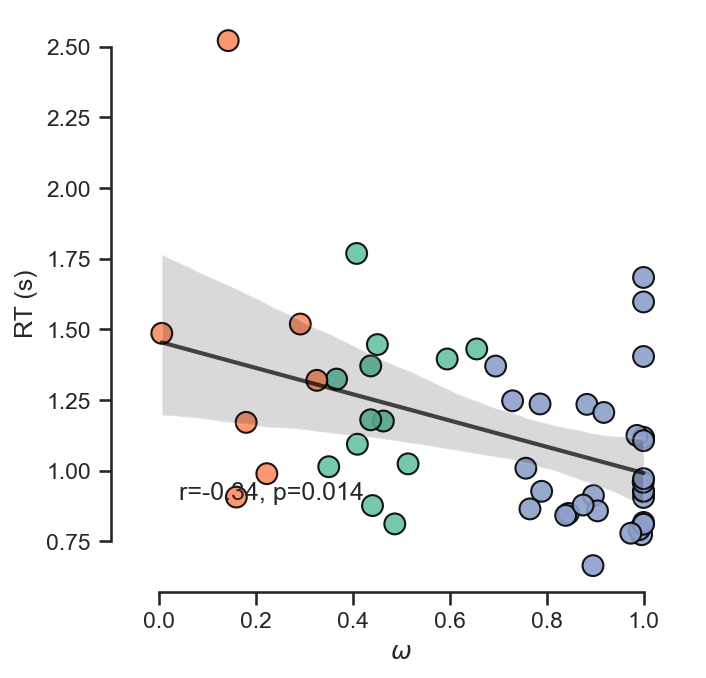

In [ ]:

avg = df_fit[(df_fit.exp=='FullPilot12_2') & (df_fit.model=='map') & (df_fit.group!='random')]\
# sort by prolificID
avg = avg.sort_values('prolificID')
omega = avg.omega.values
group = avg.group.values

# get opti_ss for FullPilot12
opti_ss = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')].groupby(['prolificID'])\
    .mean(numeric_only=True).sort_values('prolificID').reset_index().opti_ss.values
chose_risky = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')].groupby(['prolificID'])\
    .mean(numeric_only=True).sort_values('prolificID').reset_index().chose_risky.values
chose_risky = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')].groupby(['prolificID'])\
    .mean(numeric_only=True).sort_values('prolificID').reset_index().chose_risky.values
rt = df[(df.expName=='FullPilot12_2') & (df.session==3) & (df.pair.isin([0, 1])) & (df.group!='random')].groupby(['prolificID'])\
    .mean(numeric_only=True).sort_values('prolificID').reset_index().fireTime.values
# create a dataframe with omega and opti_ss
df_omega_opti = pd.DataFrame({
    'omega': omega,
    'opti_ff': opti_ff,
    'opti_ss': opti_ss,
    'chose_risky': chose_risky,
    'rt': rt,
    'group2': group
})

# change color of lmplot
colors = sns.color_palette("Set2")
sns.set({'figure.figsize': (5, 5), 'figure.dpi': 150})
sns.set_style('ticks')
sns.set_context('notebook')
sns.set_palette('Set2')
# sns.set_palette([colors[1]])
sns.scatterplot(x='omega', y='rt', data=df_omega_opti, hue='group2', palette=['C0', 'C2', 'C1'], s=100, edgecolor='black', linewidth=1, alpha=0.9)
plt.xlim(-0.1, 1.1)
# plt.ylim(-0.1, 1.1)

# add the regression black line in the background
sns.regplot(x='omega', y='rt', data=df_omega_opti, scatter=False, color='black', line_kws={'linewidth':2, 'alpha':0.7})
# pearson corr
import scipy.stats as stats

r, p = stats.spearmanr(df_omega_opti.omega, df_omega_opti.rt)

plt.text(0.04, 0.9, f'r={r:.2f}, p={p:.3f}')

plt.xlabel('$\\omega$')
# plt.xlabel('p(choose best spaceship)')
plt.ylabel('RT (s)') 

sns.despine(trim=True)
plt.legend().remove()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

value vs. combined: t-test independent samples, P_val:8.790e-02 t=1.729e+00
perceptual vs. value: t-test independent samples, P_val:1.628e-05 t=-4.546e+00
perceptual vs. combined: t-test independent samples, P_val:2.227e-05 t=-4.399e+00


C:\Users\garciaba\AppData\Local\Temp\ipykernel_3016\471753064.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


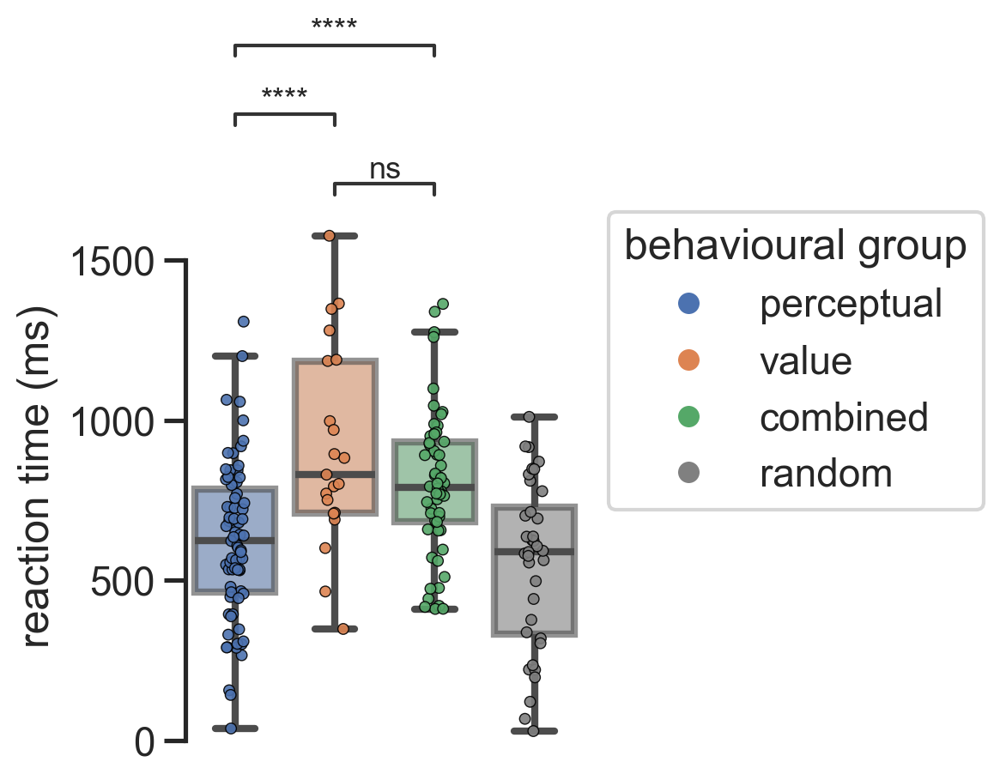

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is already defined

df_ = df.groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
order = ['perceptual', 'value', 'combined', 'random']
colors = ['C0', 'C1', 'C2', 'grey']
sns.set(rc={'figure.figsize':(3,4), 'figure.dpi': 200})
sns.set_context("talk")
sns.set_style("ticks")

# Create the boxplot without hue
ax = sns.boxplot(
    x='group', y='moveTime', data=df_, showfliers=False, boxprops=dict(alpha=0.6), zorder=-1, linewidth=3, palette=colors, order=order
)

# Create the stripplot with hue
stripplot = sns.stripplot(legend=False,
    hue='group', x='group', y='moveTime', data=df_, alpha=0.9, size=4.5, zorder=1, edgecolor='black', linewidth=0.5, order=order, palette=colors, hue_order=order
)


from matplotlib.lines import Line2D

# Manually create the legend using Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[0], markersize=10, label='perceptual'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[1], markersize=10, label='value'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[2], markersize=10, label='combined'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[3], markersize=10, label='random')
]

# Add the custom legend to the plot
plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(2, 1), borderaxespad=0., title='behavioural group')

import itertools
pairs = list(itertools.combinations(order, 2))
pairs = [('value', 'combined'), ('value', 'perceptual'), ('perceptual', 'combined')]
from statannotations.Annotator import Annotator
annotator = Annotator(ax, pairs, data=df_ , x='group', y='moveTime', order=order, loc='outside')
annotator.configure(test='t-test_ind', text_format='star', loc='outside', text_offset=0.01, fontsize=13)
annotator.apply_and_annotate()

plt.ylabel('reaction time (ms)')
plt.xlabel('')
plt.xticks([])
plt.ylim(0, 1650)
sns.despine(trim=True, bottom=True)

In [ ]:
df.grou

C:\Users\garciaba\AppData\Local\Temp\ipykernel_3016\2069657621.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


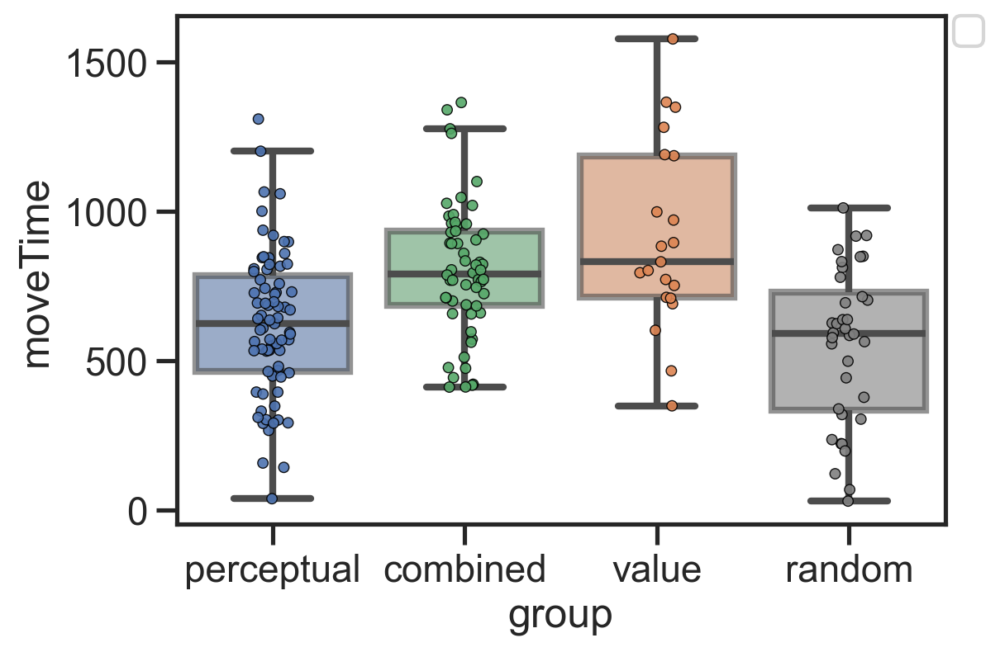

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is already defined
df_ = df.groupby(['prolificID', 'group']).mean(numeric_only=True)
order = ['perceptual', 'combined', 'value', 'random']
colors = ['C0', 'C2', 'C1', 'grey']
sns.set(rc={'figure.figsize':(6,4), 'figure.dpi': 200})
sns.set_context("talk")
sns.set_style("ticks")

# Create the boxplot without hue
ax = sns.boxplot(
    x='group', y='moveTime', data=df_, showfliers=False, boxprops=dict(alpha=0.6), zorder=-1, linewidth=3, palette=colors, order=order
)

# Create the stripplot with hue
stripplot = sns.stripplot(
    hue='group', x='group', y='moveTime', data=df_, alpha=0.9, size=4.5, zorder=1, edgecolor='black', linewidth=0.5, order=order, palette=colors, hue_order=order
)

# Manually create the legend
handles, labels = stripplot.get_legend_handles_labels()
plt.legend(title='', labels=['perceptual', 'combined', 'value', 'random'], handles=handles[:4], loc='upper right', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

plt.show()

perceptual 22
combined 14
value 13
random 15
['perceptual', 'combined', 'value', 'random']
['C0', 'C2', 'C1', 'C7']


C:\Users\basil\AppData\Local\Temp\ipykernel_16028\3528365788.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_, x='group', y='moveTime', palette=colors, order=order)
C:\Users\basil\AppData\Local\Temp\ipykernel_16028\3528365788.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_, x='group', y='fireTime', palette=colors, order=order)


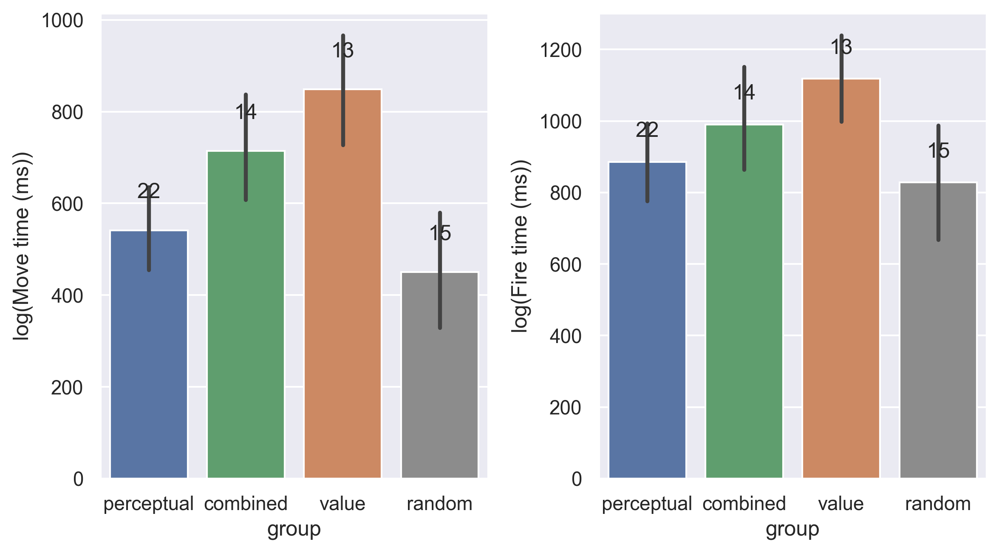

In [ ]:
# plot reaction times for each group
#fireTime
sns.set(rc={'figure.figsize':(8,4.5)})
import matplotlib.pyplot as plt

expName = ['FullPilot14']
# df_ = df[(df.expName=='FullPilot9') & (df.start_with_rl==0) & (df.session==2)]
df_ = df[(df.expName.isin(expName)) & (df.session==3)]
# df_['fireTime'] = np.log(df_['fireTime'])
# df_['moveTime'] = np.log(df_['moveTime'])
df_ = df.groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
# df_ = df[]
order_ = ['perceptual', 'combined', 'value', 'random']
colors_ = ['C0', 'C2', 'C1', 'C7']
order = []
colors = []
# if some group have no participant, pop it from order
for i, o in enumerate(order_):
    N = df_[df_.group==o].shape[0]
    print(o, N)
    # print(o, N)
    if N != 0:
        order.append(o)
        colors.append(colors_[i])

print(order)
print(colors)

plt.subplot(1, 2, 1)
sns.barplot(data=df_, x='group', y='moveTime', palette=colors, order=order)
# plot each N for each bar

for i, bar in enumerate(plt.gca().patches):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 70, df_[df_.group==order[i]].shape[0], ha='center')
# sns.stripplot(data=df, x='group', y='moveTime', palette=['C0', 'C1', 'C2'], alpha=.5)
plt.ylabel('log(Move time (ms))')
# plt.ylim(0, 2000)
plt.subplot(1, 2, 2)
sns.barplot(data=df_, x='group', y='fireTime', palette=colors, order=order)
for i, bar in enumerate(plt.gca().patches):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 70, df_[df_.group==order[i]].shape[0], ha='center')
plt.ylabel('log(Fire time (ms))')

# plt.ylim(0, 2000)
# plt.suptitle('current', fontsize=20)
plt.tight_layout()

c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 7.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 19.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


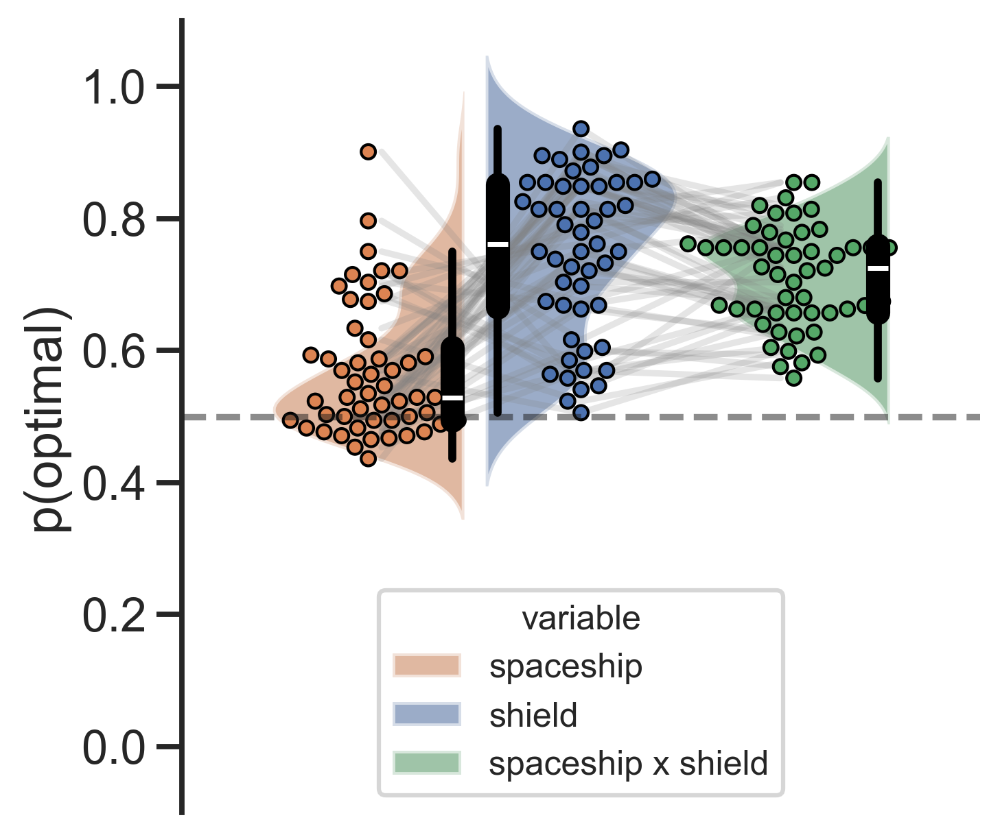

In [ ]:
sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
import matplotlib.pyplot as plt
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', df=None):
    sns.violinplot(y=y, x='expName', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5}, palette=['C1', 'C0', 'C2'])
    sns.swarmplot(y=y, x='expName', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0', 'C2'])
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df_[df_.expName==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ss')]['value']
            assert len(d1) == 1
            d2 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ff')]['value']
            assert len(d2) == 1
            d3 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ev')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            y3 = d3.values[0]
            plt.plot([j-.25, j, j+.25], [y1, y2, y3], 'grey', alpha=.2, zorder=0)

df_ = df[df.session.isin([3])]
df_ = df_[df_.group!='random']
df_ = df_[df_.expName=='FullPilot12']
df_['expName'] = df_.session - 2
# df_['expName'] = df_.session.map({3: 'session 3', 4: 'session 4'})
# df_ = df[(df.session.isin([2])) & (df.expName.isin(exp)) & (df.start_with_rl==0)]
df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
# df_ = df_[df_.expName.isin(exp)]
# rename expName to 1, 2, 3
# df_.loc[df_.expName=='FullPilot8', 'expName'] = 1
# df_.loc[df_.expName=='FullPilot9', 'expName'] = 2
# create a new df with col y= opti_ss, opti_ff, opti_ev, expName='FullPilot6.1', 'FullPilot7', value=mean(y)
df_ = pd.melt(df_, id_vars=['prolificID', 'expName'], value_vars=['opti_ss', 'opti_ff', 'opti_ev'], var_name='y', value_name='value')

# plt.subplot(1, 3, 1)

plt.plot([-0.5, len(df.session.unique())+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([])
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'shield', 'spaceship x shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
# plt.xticks([0, 1], ['session 1', 'session 2'])

In [ ]:
import scipy.stats as stats
df_ = df[df.session==3]
# paired t-test between opti_ss and opti_ff
stats.ttest_rel(df_.groupby('prolificID').opti_ff.mean(), df_.groupby('prolificID').opti_ss.mean())

TtestResult(statistic=0.7647087049533404, pvalue=0.44730005148772556, df=63)

In [ ]:
# display seaborn and matplotlib versions
import seaborn as sns
import matplotlib as mpl
print(f'Seaborn version: {sns.__version__}')
print(f'Matplotlib version: {mpl.__version__}')

Seaborn version: 0.13.2
Matplotlib version: 3.7.3


Text(0.5, 1.0, 'Y Value by X and Hue')

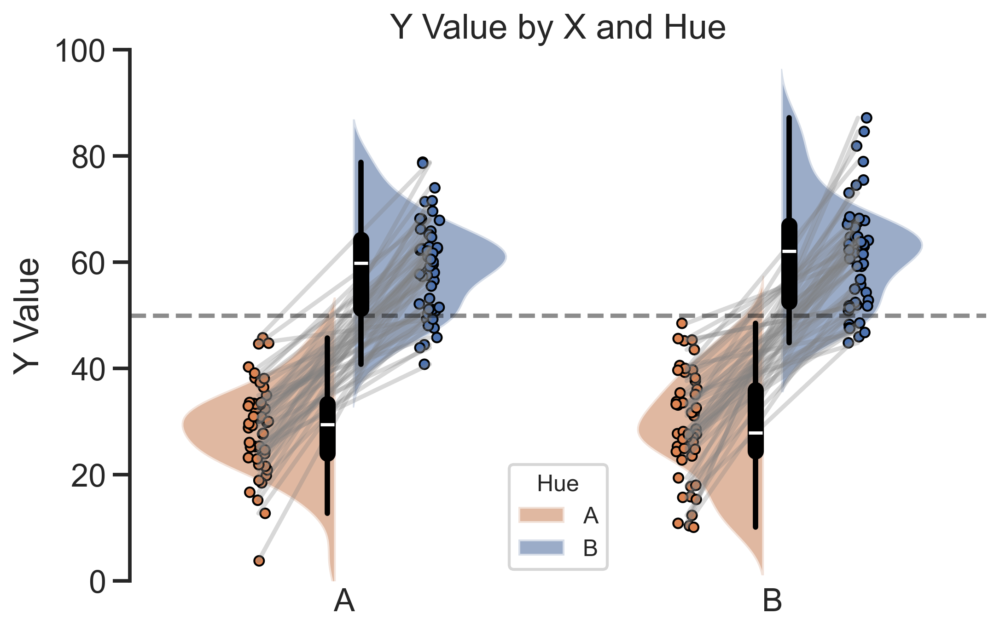

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the plot style
sns.set(rc={'figure.figsize': (8, 5), 'figure.dpi': 300})
sns.set_context('talk')
sns.set_style('ticks')

def trace_lines_between_dots(df, x, hue, id_var, y):
    for j, x_val in enumerate(np.sort(df[x].unique())):
        for i, subject in enumerate(df[df[x] == x_val][id_var].unique()):
            d1 = df[(df[id_var] == subject) & (df[x] == x_val) & (df[hue] == df[hue].unique()[0])][y]
            d2 = df[(df[id_var] == subject) & (df[x] == x_val) & (df[hue] == df[hue].unique()[1])][y]
            if len(d1) == 1 and len(d2) == 1:
                y1 = d1.values[0]
                y2 = d2.values[0]
                plt.plot([j - .2, j + .2], [y1, y2], 'grey', alpha=.3, zorder=1)

# Create a synthetic dataset with Gaussian distributions and fixed differences
np.random.seed(42)
n_subjects = 100
mean_diff = 30  # Fixed difference between the two hues
data = {
    'subject_id': np.tile(np.arange(n_subjects), 2),
    'hue': np.repeat(['A', 'B'], n_subjects),
    'x': np.tile(['A', 'B'], n_subjects),
    'y': np.concatenate([
        np.random.normal(30, 10, n_subjects),  # Mean 30, std 10 for H1
        np.random.normal(30, 10, n_subjects) + mean_diff  # Mean 60, std 10 for H2
    ])
}
df = pd.DataFrame(data)

# Melt the DataFrame for visualization
df_melted = pd.melt(df, id_vars=['subject_id', 'x', 'hue'], value_vars=['y'], var_name='y_var', value_name='value')

# Select the columns for the plot
x = 'x'
hue = 'hue'
y = 'value'

# Create the plot
plt.figure()
plt.plot([-0.5, 1.5], [50, 50], 'k--', alpha=0.5)
sns.violinplot(y=y, x=x, hue=hue, zorder=0, data=df_melted, alpha=.6, linecolor='w', gap=.1, split=True, 
              palette=['C1', 'C0'], inner_kws={'color': 'black', 'linewidth': 0.5}, inner='box')
sns.stripplot(y=y, x=x, hue=hue, zorder=1, jitter=.05, data=df_melted, dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0'])
xlim = plt.xlim()
trace_lines_between_dots(df_melted, x=x, hue=hue, id_var='subject_id', y=y)
plt.xlim(xlim)
plt.ylim(0, 100)
plt.ylabel('Y Value')
sns.despine()
plt.xlabel('')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[0:2], labels, title='Hue', loc='lower center', fontsize=12, title_fontsize=12)
plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.title('Y Value by X and Hue')


In [ ]:

tips

,total_bill,tip,sex,smoker,day,time,size,subject_id
0,16.99,1.01,Female,No,Sun,Dinner,2,7
1,10.34,1.66,Male,No,Sun,Dinner,3,20
2,21.01,3.50,Male,No,Sun,Dinner,3,29
3,23.68,3.31,Male,No,Sun,Dinner,2,15
4,24.59,3.61,Female,No,Sun,Dinner,4,11
...,...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3,24
240,27.18,2.00,Female,Yes,Sat,Dinner,2,15
241,22.67,2.00,Male,Yes,Sat,Dinner,2,27
242,17.82,1.75,Male,No,Sat,Dinner,2,22


C:\Users\basil\AppData\Local\Temp\ipykernel_12392\3040074614.py:9: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.violinplot(y=y, x='session', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True,
C:\Users\basil\AppData\Local\Temp\ipykernel_12392\3040074614.py:11: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.swarmplot(y=y, x='session', hue='y', zorder=1,
c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 23.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 27.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\basil\.pyenv\

([<matplotlib.axis.XTick at 0x23140e60c70>,
 [Text(0, 0, 'session 1'), Text(1, 0, 'session 2')])

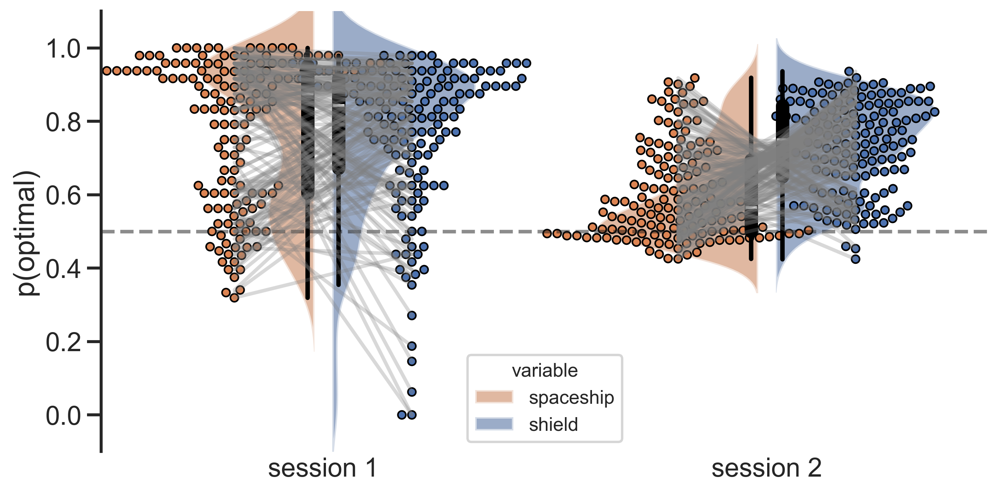

In [ ]:
sns.set(rc={'figure.figsize':(10, 5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
import matplotlib.pyplot as plt


def plot(y='value', df=None):
    sns.violinplot(y=y, x='session', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5}, palette=['C1', 'C0', 'C2'])
    sns.swarmplot(y=y, x='session', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0', 'C2'])
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)

    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)

    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.session.unique())):
        for i, name in enumerate(df_[df_.session==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.session==expname) & (df.y=='opti_ss')]['value']
            d2 = df[(df.prolificID==name) & (df.session==expname) & (df.y=='opti_ff')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            plt.plot([j-.2, j+.2], [y1, y2], 'grey', alpha=.3)

df_ = df[df.session.isin([1, 2, 3])]

df_ = df_[df_.group!='random']

df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)

df_.loc[(df_.session==2), 'opti_ff'] = df_.loc[(df_.session==1)].opti_ff.values
df_ = df_[df_.session!=1]
df_ = pd.melt(df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'], var_name='y', value_name='value')

plt.plot([-0.5, len(df.session.unique())+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([])
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.xticks([0, 1], ['session 1', 'session 2'])

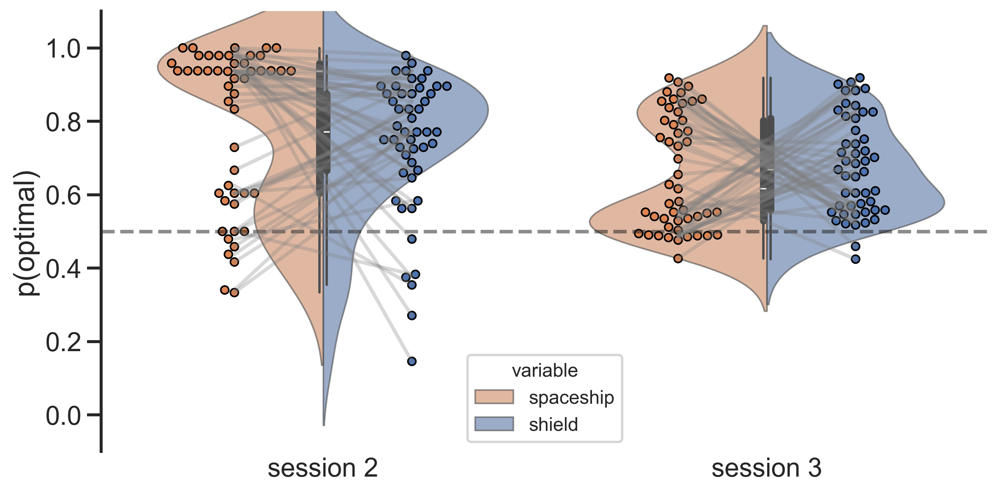

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set plot styles
sns.set(rc={'figure.figsize': (10, 5), 'figure.dpi': 300})
sns.set_context('talk')
sns.set_style('ticks')

# Adjusted plot function
def plot(y='value', df=None):
    sns.violinplot(
        y=y, x='session', hue='y', zorder=0, data=df,
        alpha=.6, linewidth=1, split=True, 
         palette=['C1', 'C0']
    )
    sns.swarmplot(
        y=y, x='session', hue='y', zorder=1,
        data=df, dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0']
    )
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)

# Function to trace grey lines between swarm dots
def trace_lines_between_dots(df=None, y='value'):
    for j, session in enumerate(np.sort(df.session.unique())):
        for i, pid in enumerate(df[df.session == session].prolificID.unique()):
            d1 = df[(df.prolificID == pid) & (df.session == session) & (df.y == 'opti_ss')]['value']
            d2 = df[(df.prolificID == pid) & (df.session == session) & (df.y == 'opti_ff')]['value']
            if not d1.empty and not d2.empty:
                plt.plot([j - 0.2, j + 0.2], [d1.values[0], d2.values[0]], 'grey', alpha=0.3)

df_ = df[df.session.isin([1, 2, 3])]
df_ = df_[df_.group!='random']
df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)
df_.loc[(df_.session==2), 'opti_ff'] = df_.loc[(df_.session==1)].opti_ff.values
df_ = df_[df_.session!=1]

df_ = pd.melt(
    df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'],
    var_name='y', value_name='value'
)

# Plotting
plt.figure()
plt.plot([-0.5, len(df_.session.unique()) + 0.5], [0.5, 0.5], 'k--', alpha=0.5)
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([0, 1], ['session 2', 'session 3'])

# Adjust legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[:2], ['spaceship', 'shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.show()


# df_ = pd.melt(df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'], var_name='y', value_name='value')


In [ ]:
# count number of trials per session in FullPilot6
df[df.expName == 'FullPilot6'].groupby('session').t.nunique()
# in session 1 identify pairs (name 1, name 2) and compute average outcome (outcome 1, outcome 2)
df[(df.expName == 'FullPilot6') & (df.session == 1)].groupby(['name1']).outcome1.mean()

name1
FFEnemyShipNocolors1    62.708333
FFEnemyShipNocolors3    70.638889
Name: outcome1, dtype: float64

In [ ]:
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.name2=='FFEnemyShipNoColors12'), 'pair'] = 0
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.name2!='FFEnemyShipNoColors12'), 'pair'] = 1

df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==0), 'm1'] = 62
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==0), 'm2'] = 38
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==1), 'm1'] = 72
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==1), 'm2'] = 28

# now recompute ev1 and ev2 by multiplying m1 and m2 by p1 and p2
df['ev1'] = df.m1 * df.p1
df['ev2'] = df.m2 * df.p2

# Check overall stats

In [ ]:
print('number of trials=', df.shape[0])
print('overall outcome mean=', pd.concat((df.outcome1, df.outcome2)).mean())
print('overall theoretical mean=', pd.concat((df.m1, df.m2)).mean())
print('overall p mean=', pd.concat((df.p1, df.p2)).mean())
print('outcome1 mean=', df.outcome1.mean())
print('outcome2 mean=', df.outcome2.mean())
print('p1 mean=', df.p1.mean())
print('p2 mean=', df.p2.mean())
print('p1 std=', df.p1.std())
print('p2 std=', df.p2.std())

# compute observed mean for each spaceship
names = pd.concat([df.name1, df.name2]).unique()
names

number of trials= 1728
overall outcome mean= 50.30555555555556
overall theoretical mean= 50.0
overall p mean= 0.5833333333333334
outcome1 mean= 62.536458333333336
outcome2 mean= 38.07465277777778
p1 mean= 0.5833333333333334
p2 mean= 0.5833333333333334
p1 std= 0.30486501137263305
p2 std= 0.30486501137263305


array(['FFEnemyNeutral', 'FFEnemyShipNocolors5', 'FFEnemyShipNocolors8',
       'FFEnemyShipNocolors3', 'FFEnemyShipNoColors11',
       'FFEnemyShipNoColors9', 'FFEnemyShipNocolors2',
       'FFEnemyShipNoColors12', 'FFEnemyShipNocolors6',
       'FFEnemyShipNocolors7', 'FFEnemyShipNocolors1'], dtype=object)

In [ ]:
# compute STD rewards for each expName
for exp in df.expName.unique():
    print(exp, df[(df.expName==exp) & (df.session.isin([1]))].outcome2.std())

FullPilot 18.603439051822996
FullPilot2 18.78485790646308
FullPilot3 10.517116715109028
FullPilot4 5.126841986386545
FullPilot5 10.717873399201743


# Check Means

In [ ]:
# compute observed mean for each spaceship
names = pd.concat([df.name1, df.name2]).unique()

for name in names:
    print(name)
    observed_mean1 = np.round(df[(df.name1==name) & (df.destroyed==1)].outcome1.mean(), 2)
    observed_mean2 = np.round(df[(df.name2==name) & (df.destroyed==1)].outcome2.mean(), 2)
    if not np.isnan(observed_mean1):
        print('observed mean 1=', observed_mean1, 'true mean=', df[df.name1==name].m1.mean())
    if not np.isnan(observed_mean2):
        print('observed mean 2=', observed_mean2, 'true mean=', df[df.name2==name].m2.mean())

FFEnemyNeutral
observed mean 1= 50.0 true mean= 50.0
observed mean 2= 50.0 true mean= 50.0
FFEnemyShipNocolors5
observed mean 1= 66.07 true mean= 67.0
observed mean 2= 35.03 true mean= 33.0
FFEnemyShipNocolors8
observed mean 1= 69.62 true mean= 72.0
observed mean 2= 30.34 true mean= 28.0
FFEnemyShipNocolors3
observed mean 1= 62.03 true mean= 62.0
FFEnemyShipNoColors11
observed mean 1= 63.24 true mean= 62.0
observed mean 2= 36.05 true mean= 38.0
FFEnemyShipNoColors9
observed mean 1= 66.92 true mean= 72.0
observed mean 2= 34.61 true mean= 28.0
FFEnemyShipNocolors2
observed mean 1= 63.52 true mean= 67.0
observed mean 2= 36.51 true mean= 33.0
FFEnemyShipNoColors12
observed mean 1= 66.98 true mean= 72.0
observed mean 2= 29.83 true mean= 28.0
FFEnemyShipNocolors6
observed mean 1= 62.36 true mean= 62.0
observed mean 2= 38.03 true mean= 38.0
FFEnemyShipNocolors7
observed mean 1= 68.75 true mean= 72.0
observed mean 2= 31.57 true mean= 28.0
FFEnemyShipNocolors1
observed mean 2= 42.31 true mean= 

([<matplotlib.axis.YTick at 0x1b1d436e580>,
 [Text(0, 0.0, '0.0'),
  Text(0, 0.1, '0.1'),
  Text(0, 0.2, '0.2'),
  Text(0, 0.30000000000000004, '0.3'),
  Text(0, 0.4, '0.4'),
  Text(0, 0.5, '0.5'),
  Text(0, 0.6000000000000001, '0.6'),
  Text(0, 0.7000000000000001, '0.7'),
  Text(0, 0.8, '0.8'),
  Text(0, 0.9, '0.9'),
  Text(0, 1.0, '1.0')])

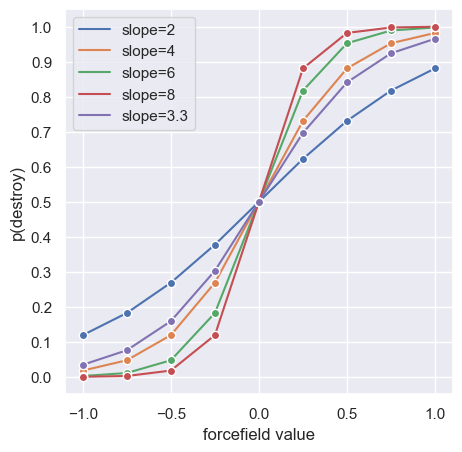

In [ ]:
x1 = np.linspace(-1, 1, 9)
slope1 = -2
x2= np.linspace(-1, 1, 9)
slope2 = -4
x3 = np.linspace(-1, 1, 9)
slope3 = -6
x4 = np.linspace(-1, 1, 9)
slope4 = -8
x5 = np.linspace(-1, 1, 9)
slope5 = -3.33

logistic = lambda x, slope: 1 / (1 + np.exp(slope*x))

sns.set({'figure.figsize': (5, 5), 'figure.dpi': 100})
sns.scatterplot(x=x1, y=logistic(x1, slope1), color='C0', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x2, y=logistic(x2, slope2), color='C1', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x3, y=logistic(x3, slope3), color='C2', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x4, y=logistic(x4, slope4), color='C3', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x5, y=logistic(x5, slope5), color='C4', edgecolor='white', lw=1, zorder=10)

sns.lineplot(x=x1, y=logistic(x1, slope1), color='C0', markers=True, dashes=False, label='slope=2')
sns.lineplot(x=x2, y=logistic(x2, slope2), color='C1', markers=True, dashes=False, label='slope=4')
sns.lineplot(x=x3, y=logistic(x3, slope3), color='C2', markers=True, dashes=False, label='slope=6')
sns.lineplot(x=x4, y=logistic(x4, slope4), color='C3', markers=True, dashes=False, label='slope=8')
sns.lineplot(x=x5, y=logistic(x5, slope5), color='C4', markers=True, dashes=False, label='slope=3.3')
plt.xlim(-1.1, 1.1)
plt.xlabel('forcefield value')
plt.ylabel('p(destroy)')

# yticks should be .1, .2, .3, .4, .5, .6, .7, .8, .9
plt.yticks(np.arange(0, 1.1, .1))

In [ ]:
exp = 'FullPilot5'
session = 2

df_ = df[(df.expName == exp) & (df.session == session)]

for p1 in df_.p1.unique():
    print(p1, df_[(df_.p1 == p1) & (df_.choice == 1)].destroyed.mean())

0.27 0.44
0.38 0.5
0.73 0.8157894736842105
0.5 0.45714285714285713
0.12 0.047619047619047616
0.18 0.21739130434782608
0.88 0.84375
0.62 0.5862068965517241
0.82 0.8780487804878049


In [ ]:
df.datetime

20191    2024-04-29 16:15:53
20192    2024-04-29 16:15:57
20193    2024-04-29 16:16:01
20194    2024-04-29 16:16:04
20195    2024-04-29 16:16:07
                ...         
57852    2024-06-05 15:51:06
57853    2024-06-05 15:51:11
57854    2024-06-05 15:51:15
57855    2024-06-05 15:51:19
57856    2024-06-05 15:51:24
Name: datetime, Length: 34597, dtype: object

In [ ]:
#sum outcomes

for pid in df.prolificID[df.datetime.str.contains('2024-05-30')].unique():
    obtained = df[(df.prolificID==pid) & (df.destroyed==1) & (df.choice==1)].outcome1.sum() + df[(df.prolificID==pid) &(df.destroyed==1) & (df.choice==2)].outcome2.sum()
    obtained = np.round(obtained* 0.00028, 2)
    print(f'{pid},{obtained}')


576ad50bc8a90000010d99c8,3.63
5c95493ddd325800166f838a,4.61
655f95ffd90905e27c938a49,3.9
6630f8c1f995b01de9767c7d,4.42
61230b14a3bcb65c585dfdaa,4.71
655f98627ee2491a2184c294,4.31
65dcca0d187f1e33aa00fca1,4.36
6574a4e29c6576b736f0388b,4.38
6117be8d81c34e0b13821371,4.88
62ceba5fdab49dfc90278cbb,4.0


In [ ]:
df[df.session.isin([2])].m1.unique()

array([72, 62], dtype=int64)

In [ ]:
# for each p compute the probability of destroying the spaceship
pp = pd.concat([df.p1, df.p2]).unique()
for p in sorted(pp):
    print(p)
    # print('p1=', p, 'p2=', 1-p)
    # get all instances of p1 and p2 = p
    all = df[((df.p1==p) & (df.choice==1)) | ((df.p2==p) & (df.choice==2))]
    print('observed mean=', all.destroyed.mean())
    # compute the probability of destroying the spaceship


0.12
observed mean= 0.12737127371273713
0.18
observed mean= 0.1655011655011655
0.27
observed mean= 0.2616033755274262
0.38
observed mean= 0.355877616747182
0.5
observed mean= 0.4993646759847522
0.62
observed mean= 0.624332977588047
0.73
observed mean= 0.7373646209386282
0.82
observed mean= 0.8207792207792208
0.88
observed mean= 0.8802122820318423
1.0
observed mean= 1.0


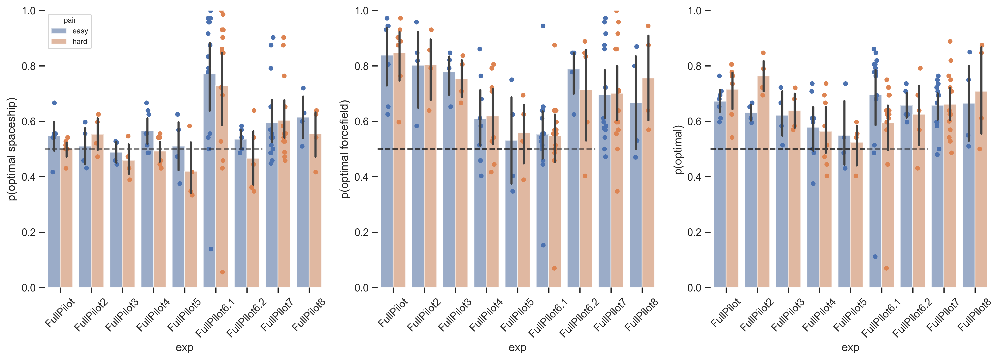

In [ ]:
df['opti_ss'] = df.choice==1 # ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
import matplotlib.pyplot as plt
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(15, 5.5), 'figure.dpi':300})
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



df_ = df[df.session.isin([2])]

exp = ['FullPilot1', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6']

df_ = df_.groupby(['expName', 'prolificID', 'pair2'], as_index=False).mean(numeric_only=True)
df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']

plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ss', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ss', x='expName', hue='pair2', zorder=1,
              data=df_,dodge=True)
plt.ylim(0, 1)
plt.ylabel('p(optimal spaceship)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[0:2], labels[0:2], title='pair', loc='upper left', fontsize=8, title_fontsize=8
           )

plt.subplot(1, 3, 2)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ff', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ff', x='expName', hue='pair2', zorder=1,
                data=df_, dodge=True)

sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal forcefield)')
plt.ylim(0, 1)
plt.legend([],[], frameon=False)
plt.tight_layout()

plt.xticks(rotation=45)
plt.subplot(1, 3, 3)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ev', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ev', x='expName', hue='pair2', zorder=1,
                data=df_, dodge=True)
#remove legend
plt.legend([],[], frameon=False)
sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal)')
plt.ylim(0, 1)
plt.tight_layout()
plt.xticks(rotation=45)

sns.despine(bottom=True, left=True)


Text(-0.4, -0.2, '3 = counterfactual + reward/2')

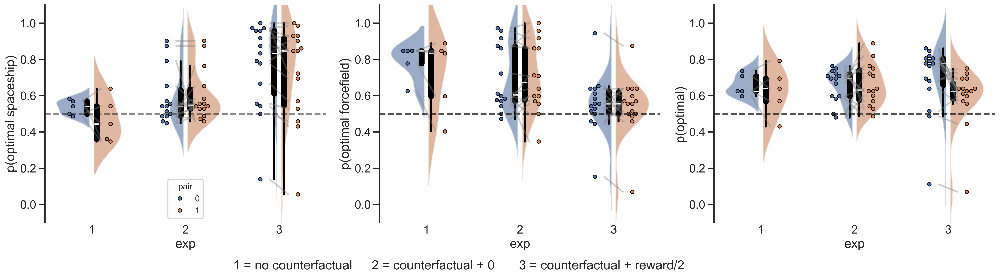

In [ ]:
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'
import matplotlib.pyplot as plt
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(20, 5.5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')

def plot(y='opti_ss', df=None):
    sns.violinplot(y=y, x='expName', hue='pair2', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True,
                     inner_kws={'color': 'black', 'linewidth': 0.5})
    sns.swarmplot(y=y, x='expName', hue='pair2', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1)
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df[df.expName==expname].prolificID.unique()):
            y2 = df[(df.prolificID==name) & (df.pair2=='hard') & (df.expName==expname)][y].values[0]
            y1 = df[(df.prolificID==name) & (df.pair2=='easy') & (df.expName==expname)][y].values[0]
            plt.plot([j-.1, j+.1], [y1, y2], 'grey', alpha=.4)


df_ = df[df.session.isin([2])]

exp = ['FullPilot6.2', 'FullPilot6.1', 'FullPilot7']

df_ = df_.groupby(['expName', 'prolificID', 'pair2'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
df_ = df_[df_.expName.isin(exp)]
df_.loc[df_.expName=='FullPilot6.2', 'expName'] = 1
df_.loc[df_.expName=='FullPilot6.1', 'expName'] = 3
df_.loc[df_.expName=='FullPilot7', 'expName'] = 2
plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ss', df=df_)
plt.ylabel('p(optimal spaceship)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[2:], labels[2:], title='pair', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)


plt.subplot(1, 3, 2)
plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ff', df=df_)

sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal forcefield)')
plt.legend([],[], frameon=False)
plt.tight_layout()

# plt.xticks(rotation=45)
plt.tick_params(axis='x', length=0)



plt.subplot(1, 3, 3)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ev', df=df_)
#remove legend
plt.legend([],[], frameon=False)
sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal)')
plt.tight_layout()
# plt.xticks(rotation=45)

sns.despine(bottom=True)
# remove xticks length
plt.tick_params(axis='x', length=0)

# plt.xticks([0, 1, 2], ['no counterfactual', 'counterfactual + 0', 'counterfactual + reward/2'])

# create a legend without color 
# with just this labeling
# legend 1= no counterfactual, 2= counterfactual + 0, 3= counterfactual + reward/2

plt.annotate('1 = no counterfactual', xy=(0, 0), xytext=(-1.5, -0.2), textcoords='axes fraction', ha='center', va='center')
plt.annotate('2 = counterfactual + 0', xy=(0, 0), xytext=(-1, -0.2), textcoords='axes fraction', ha='center', va='center')
plt.annotate('3 = counterfactual + reward/2', xy=(0, 0), xytext=(-.4, -0.2), textcoords='axes fraction', ha='center', va='center')


([<matplotlib.axis.XTick at 0x1d33670e580>,
 [Text(0, 0, 'no counterfactual'),
  Text(1, 0, 'counterfactual + 0'),
  Text(2, 0, 'counterfactual + reward/2'),
  Text(3, 0, 'controls')])

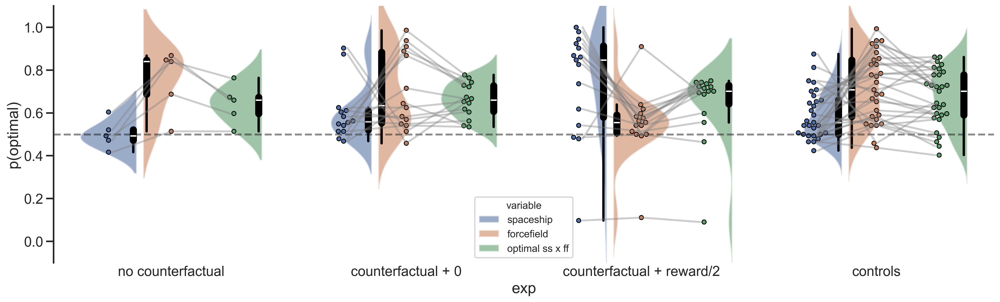

In [ ]:
df = pd.read_csv('../data/raw/controls_start_with_rl_7.csv')
df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'
# exclude prolificID with less than 432 trials
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)

# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
import matplotlib.pyplot as plt


# ignore if pair < 0
df = df[df.pair >= 0]
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(20, 5.5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', df=None):
    sns.violinplot(y=y, x='expName', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5})
    sns.swarmplot(y=y, x='expName', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1)
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df_[df_.expName==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ss')]['value']
            assert len(d1) == 1
            d2 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ff')]['value']
            assert len(d2) == 1
            d3 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ev')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            y3 = d3.values[0]
            plt.plot([j-.25, j, j+.25], [y1, y2, y3], 'grey', alpha=.4)


df_ = df[df.session.isin([2])]

exp = ['FullPilot6.2', 'FullPilot6.1', 'FullPilot7', 'FullPilot8']

df_ = df_.groupby(['expName', 'prolificID'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
df_ = df_[df_.expName.isin(exp)]
# rename expName to 1, 2, 3
df_.loc[df_.expName=='FullPilot6.2', 'expName'] = 1
df_.loc[df_.expName=='FullPilot6.1', 'expName'] = 3
df_.loc[df_.expName=='FullPilot7', 'expName'] = 2
df_.loc[df_.expName=='FullPilot8', 'expName'] = 4
# create a new df with col y= opti_ss, opti_ff, opti_ev, expName='FullPilot6.1', 'FullPilot7', value=mean(y)
df_ = pd.melt(df_, id_vars=['expName', 'prolificID'], value_vars=['opti_ss', 'opti_ff', 'opti_ev'], var_name='y', value_name='value')

# plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'forcefield', 'optimal ss x ff'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.xticks([0, 1, 2, 3], ['no counterfactual', 'counterfactual + 0', 'counterfactual + reward/2', 'controls'])

C:\Users\basil\AppData\Local\Temp\ipykernel_18704\2733277918.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\2733277918.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')


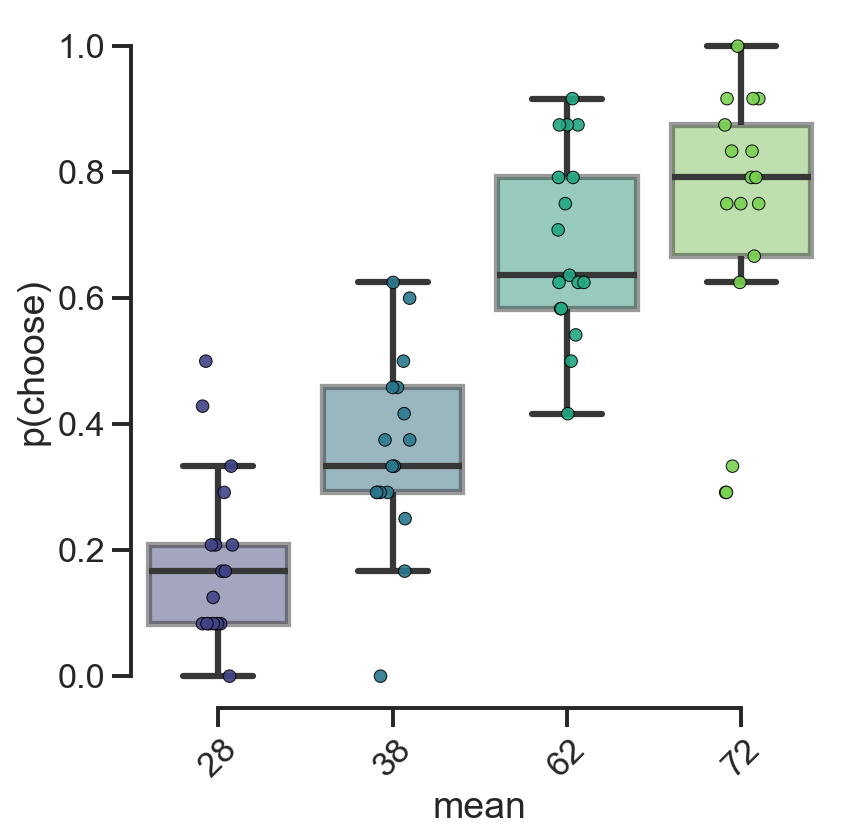

In [ ]:
df = pd.read_csv('../data/raw/control_40.csv')
df = df[df.expName=='FullPilot8']


df = df[df.session.isin([1])]
# ddf = df.copy()
# set id to prolificID
df['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
# pp = np.unique(np.array([df.p1.unique(), df.p2.unique()]).flatten())
mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
# logit = lambda x: 1/(1+np.exp(-2*x))
# print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
# assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in df.id.unique():
    ddf = df[(df.id == pid)]
    # for p1 in pp:
    #     n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
    #     p_freq.append(
    #         {
    #          'id': pid,
    #          'p': p1,
    #          'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
    #          'N_p': n_p1,
    #          'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
    #         }
    #     )
    
    for m in mm:
        n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
        m_freq.append(
            {
              'id': pid,
             'm': m,
             'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
             'N_m': n_m,
             'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
            }
        ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)   

sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('mean')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars
# for i in range(d_freq.N
    # plt.text(i, d_freq.choice_freq[i], d_freq.N[i], ha='center', va='bottom')
# pairs = set(map(tuple, (np.array([df.p1, df.p2]).T)))
# pairs = sorted(pairs, key=lambda x: abs(x[0] - x[1]))

# count = 0
# for p in pp:
#     # (a) plot text for N p appears in a pair
#     # (b) plot N for N p appears in a pair and is best response
#     # must be a/b
#     a = sum([p in pair for pair in pairs])
#     b = sum([(p in pair) and (p == max(pair)) for pair in pairs])
#     plt.text(count, 0.5, f'{b}/{a}', ha='center', va='bottom', fontsize=8)
#     count += 1

[0.12, 0.18, 0.27, 0.38, 0.5, 0.62, 0.73, 0.82, 0.88]


C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:26: RuntimeWarning: invalid value encountered in scalar divide
  'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:28: RuntimeWarning: invalid value encountered in scalar divide
  'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:53: FutureWarning: 

Passing `palette` witho

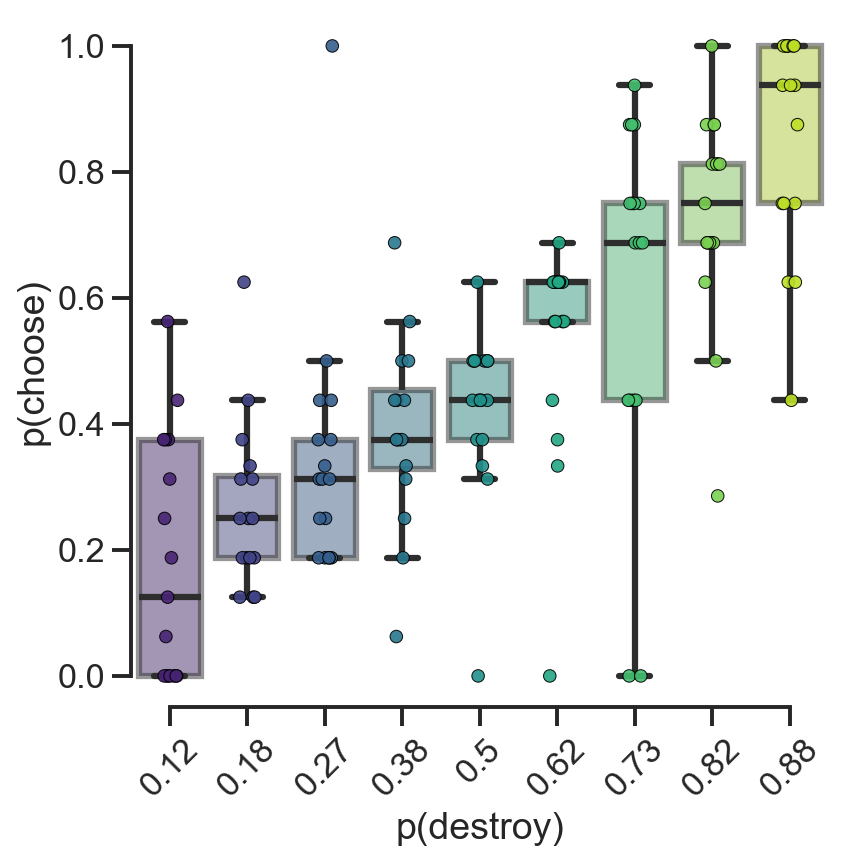

In [ ]:
df = pd.read_csv('../data/raw/controls14.csv')
df = df[df.expName=='FullPilot8']
df = df[df.session.isin([0])]
# ddf = df.copy()
# set id to prolificID
df['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
pp = np.unique(np.array([df.p1.unique(), df.p2.unique()]).flatten())
# mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
logit = lambda x: 1/(1+np.exp(-2*x))
print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in df.id.unique():
    ddf = df[(df.id == pid)]
    for p1 in pp:
        n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
        p_freq.append(
            {
             'id': pid,
             'p': p1,
             'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
             'N_p': n_p1,
             'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
            }
        )
    
    # for m in mm:
    #     n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
    #     m_freq.append(
    #         {
    #           'id': pid,
    #          'm': m,
    #          'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
    #          'N_m': n_m,
    #          'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
    #         }
    #     ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)   

sns.stripplot(x='p', y='choice_freq_p',data=p_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('p(destroy)')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars
# for i in range(d_freq.N
    # plt.text(i, d_freq.choice_freq[i], d_freq.N[i], ha='center', va='bottom')
# pairs = set(map(tuple, (np.array([df.p1, df.p2]).T)))
# pairs = sorted(pairs, key=lambda x: abs(x[0] - x[1]))

# count = 0
# for p in pp:
#     # (a) plot text for N p appears in a pair
#     # (b) plot N for N p appears in a pair and is best response
#     # must be a/b
#     a = sum([p in pair for pair in pairs])
#     b = sum([(p in pair) and (p == max(pair)) for pair in pairs])
#     plt.text(count, 0.5, f'{b}/{a}', ha='center', va='bottom', fontsize=8)
#     count += 1

(0.0, 1.0)

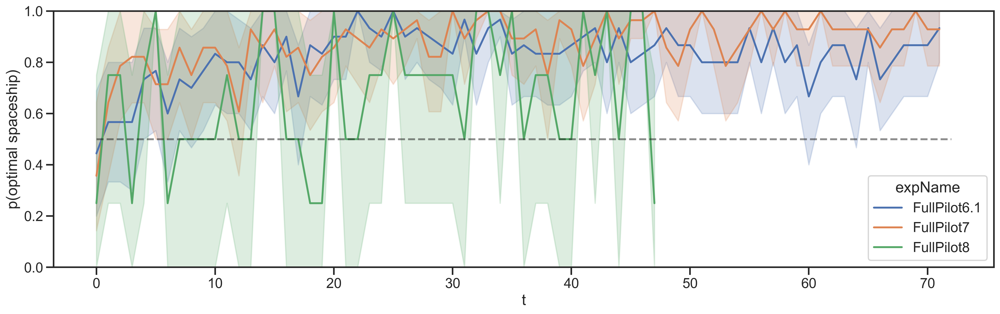

In [ ]:
# plot learning in session 1 over time (opti_ss)

df_ = df[df.session.isin([1])]
df_ = df_.groupby(['expName', 'prolificID', 't'], as_index=False).mean(numeric_only=True)
df_ = df_[df_.expName.isin(['FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

sns.lineplot(x='t', y='opti_ss', hue='expName', data=df_)
plt.ylabel('p(optimal spaceship)')
plt.plot([0, 72], [0.5, 0.5], 'k--', alpha=0.5)
plt.ylim(0, 1)

In [ ]:
df_[df_.pair2=='easy'][['prolificID', 'opti_ss', 'opti_ff', 'opti_ev']].groupby('prolificID').mean()

,opti_ss,opti_ff,opti_ev
prolificID,,,
576ad50bc8a90000010d99c8,0.513889,0.597222,0.597222
5a3bdd2c8d005a0001829f3e,0.500000,0.944444,0.694444
5c95493ddd325800166f838a,0.791667,0.611111,0.736111
5d4b265b72db9d0015e8aac6,0.958333,0.555556,0.819444
5dc1eb838a84461511b3cd73,0.972222,0.527778,0.805556
5e307edef5abed05e1736185,0.555556,0.916667,0.708333
606b6705399a272af8238dad,0.791667,0.513889,0.680556
6079ff1600ff2b7455e1c3e0,1.000000,0.541667,0.861111
6117be8d81c34e0b13821371,0.448000,0.576000,0.480000


In [ ]:

df_[df_.pair2=='hard'][['prolificID', 'opti_ss', 'opti_ff', 'opti_ev']].groupby('prolificID').mean()

,opti_ss,opti_ff,opti_ev
prolificID,,,
576ad50bc8a90000010d99c8,0.652778,0.569444,0.638889
5c95493ddd325800166f838a,0.458333,0.638889,0.569444
5e307edef5abed05e1736185,0.555556,0.861111,0.819444
606b6705399a272af8238dad,0.861111,0.638889,0.750000
6117be8d81c34e0b13821371,0.488000,0.712000,0.600000
61230b14a3bcb65c585dfdaa,0.527778,0.916667,0.763889
62a96f8f6ab7e0c3ce90095f,0.930556,0.500000,0.638889
62ceba5fdab49dfc90278cbb,0.527778,0.500000,0.486111
63d13f416b2c25038c13007f,0.763889,0.597222,0.708333


In [ ]:
#2024-05-22 == fullpilot6.1
df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'


c:\Python312\Lib\site-packages\seaborn\_core.py:1225: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='pair', ylabel='opti_ss'>

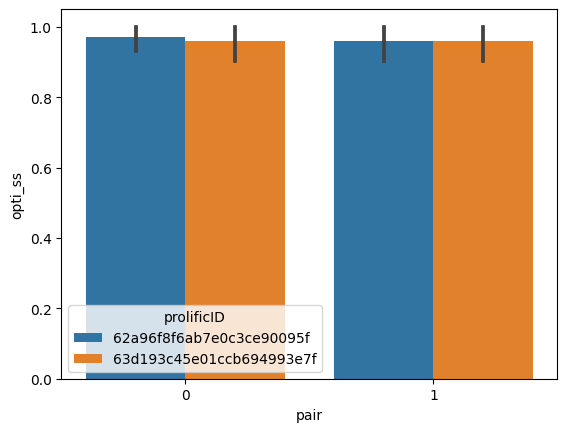

In [ ]:
df['opti_ss'] = df.choice==1 #((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
dd = df[df.expName=='FullPilot6']
dd = dd[dd.session.isin([3])]

sns.barplot(y='opti_ss', x='pair', hue='prolificID',  data=dd)

AttributeError: Rectangle.set() got an unexpected keyword argument 'errorbar'

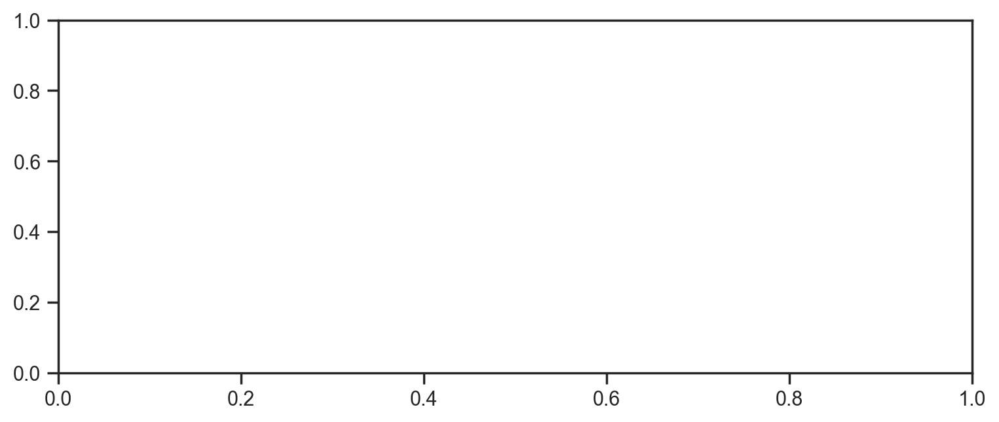

In [ ]:

sns.barplot(
    x='expName', y='score', data=df.groupby(['prolificID', 'expName'], as_index=True).score.max().reset_index(), errorbar='se',
    order=['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5'])

In [ ]:
# compute ev delta 
df['ev_delta'] = (df.ev1 - df.ev2).abs()

plt.figure(figsize=(15, 5))
# show linear regression of ev delta on correct
sns.lmplot(x='ev_delta', y='correct', data=df[df.session.isin([2,3])])

#show that with pointplot
sns.pointplot(x='ev_delta', y='correct', linestyle='none', join=False,
              data=df[df.session.isin([2,3])].groupby(['prolificID', 'ev_delta'], as_index=False).mean())

plt.ylim(0,1)

# angle xticks
plt.xticks(rotation=45)

NameError: name 'plt' is not defined

2580
-2
-1
0
1


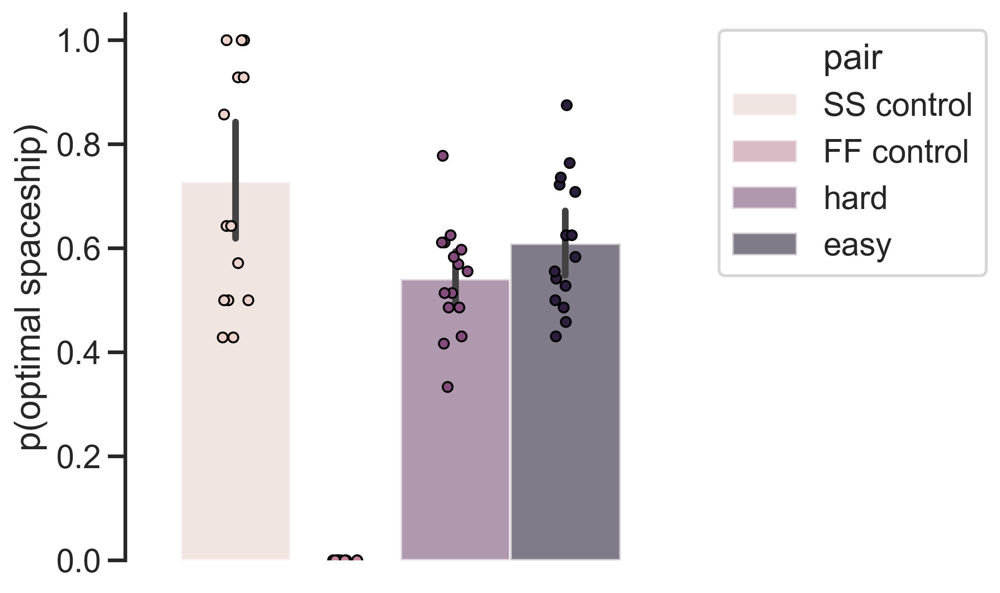

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)

sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
sns.set_context('talk')
sns.set_style('ticks')  
sns.set_palette('Set2')
df = pd.read_csv('../data/raw/controls14.csv')

df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

# exclude prolificID with less than 432 trials
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

# df = df[(df.prolificID=='unity') & df.datetime.str.contains('2024-06-04')] 

df = df[(df.session==3) & (df.expName=='FullPilot8')]
# drop duplicates
df = df.drop_duplicates(subset=['expName', 'session', 't', 'prolificID'], keep='last')
print(len(df))
# 
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))

df = df.groupby(['expName', 'prolificID', 'pair'], as_index=False).mean(numeric_only=True)
sns.set_palette('Set2')
sns.barplot(x='expName', y='opti_ss', hue="pair", data=df, alpha=.6)
sns.stripplot(x='expName', y='opti_ss', hue="pair", data=df, dodge=True, edgecolor='black', linewidth=1)

plt.ylabel('p(optimal spaceship)')
plt.xlabel('')
#get x position of each bar from plt
x = [p.get_x() + p.get_width() / 2 for p in plt.gca().patches]

# add number of trial per pair in the legend
count = 0
for pair in sorted(df.pair.unique()):
    print(pair)
    n = len(df[(df.expName=='FullPilot8') & (df.pair==pair)])
    # plt.text(x=x[count], y=0.5, s=n, ha='center', va='center')
    count += 1
    
plt.xlabel('')
plt.xticks([])
sns.despine(bottom=True)


# get handles and labels of the legend
handles, labels = plt.gca().get_legend_handles_labels()
#set legend outside of the plot on the right
plt.legend(title='pair', handles=handles[:-4], bbox_to_anchor=(1.05, 1), loc='upper left', labels=['SS control', 'FF control', 'hard', 'easy'])


2580
-2
-1
0
1


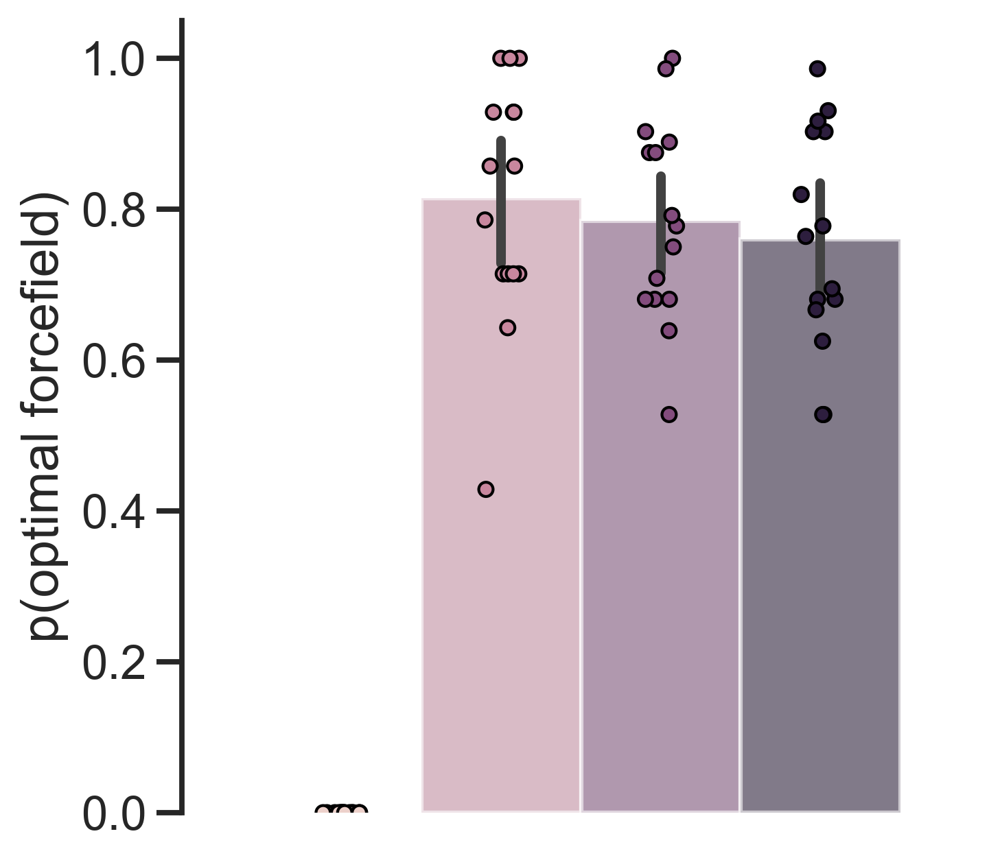

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)

sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
sns.set_context('talk')
sns.set_style('ticks')  
sns.set_palette('Set2')
df = pd.read_csv('../data/raw/controls14.csv')

df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

# exclude prolificID with less than 432 trials
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

# df = df[(df.prolificID=='unity') & df.datetime.str.contains('2024-06-04')] 

df = df[(df.session==3) & (df.expName=='FullPilot8')]
# drop duplicates
df = df.drop_duplicates(subset=['expName', 'session', 't', 'prolificID'], keep='last')
print(len(df))

df['p1'] = df.apply(lambda x: 1 if x.pair == -2 else x.p1, axis=1)
df['p2'] = df.apply(lambda x: 1 if x.pair == -2 else x.p2, axis=1)
# 
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))

df = df.groupby(['expName', 'prolificID', 'pair'], as_index=False).mean(numeric_only=True)
sns.set_palette('Set2')
sns.barplot(x='expName', y='opti_ff', hue="pair", data=df, alpha=.6)
sns.stripplot(x='expName', y='opti_ff', hue="pair", data=df, dodge=True,linewidth=1, edgecolor='black')

plt.ylabel('p(optimal forcefield)')
plt.xlabel('')
plt.xticks([])
sns.despine(bottom=True)
#get x position of each bar from plt
x = [p.get_x() + p.get_width() / 2 for p in plt.gca().patches]

# add number of trial per pair in the legend
count = 0
for pair in sorted(df.pair.unique()):
    print(pair)
    n = len(df[(df.expName=='FullPilot8') & (df.pair==pair)])
    # plt.text(x=x[count], y=0.5, s=n, ha='center', va='center')
    count += 1
    
plt.legend([],[], frameon=False)
# get handles and labels of the legend
# handles, labels = plt.gca().get_legend_handles_labels()
#set legend outside of the plot on the right
# plt.legend(title='pair', handles=handles[:-4], bbox_to_anchor=(1.05, 1), loc='upper left', labels=['SS control', 'FF control', 'hard', 'easy'])


In [ ]:
df = pd.read_csv('../data/raw/controls14.csv')
df = df[(df.session==1) & (df.expName=='FullPilot8')]
df[df.pair==0]

,prolificID,expName,session,t,pair,choice,outcome1,outcome2,choseLeft,op1IsLeft,...,ev2,p1,p2,m1,m2,name1,name2,destroyed,score,datetime
50383,unity,FullPilot8,1,0,0,1,70,37,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,70,2024-06-04 20:59:48
50389,unity,FullPilot8,1,4,0,1,53,16,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,292,2024-06-04 21:00:49
50422,test,FullPilot8,1,0,0,1,61,25,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,61,2024-06-04 21:19:15
50423,test,FullPilot8,1,1,0,1,58,46,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,119,2024-06-04 21:19:19
50426,test,FullPilot8,1,4,0,0,65,32,0,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,0,185,2024-06-04 21:19:38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57376,5685850c333cbd000d4e042f,FullPilot8,1,29,0,1,53,28,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,1948,2024-06-05 15:24:55
57389,5685850c333cbd000d4e042f,FullPilot8,1,37,0,1,57,49,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2416,2024-06-05 15:25:24
57396,5685850c333cbd000d4e042f,FullPilot8,1,42,0,1,61,24,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2703,2024-06-05 15:25:43
57397,5685850c333cbd000d4e042f,FullPilot8,1,43,0,1,43,49,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2746,2024-06-05 15:25:47


In [ ]:
# ========== IMPROVED SMOOTHING METHODS FOR BEHAVIORAL DATA ==========

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import signal
from scipy.ndimage import uniform_filter1d, gaussian_filter1d

def smooth_behavioral_data(data, method='rolling', **kwargs):
    """
    Apply various smoothing methods to behavioral data
    
    Parameters:
    -----------
    data : array-like
        The data to smooth
    method : str
        Smoothing method: 'rolling', 'gaussian', 'savgol', 'exponential', 'lowess'
    **kwargs : additional parameters for each method
    """
    
    if method == 'rolling':
        window = kwargs.get('window', 50)
        return pd.Series(data).rolling(window=window, center=True, min_periods=1).mean()
    
    elif method == 'gaussian':
        sigma = kwargs.get('sigma', 15)  # Standard deviation for Gaussian kernel
        return gaussian_filter1d(data, sigma=sigma)
    
    elif method == 'savgol':
        window_length = kwargs.get('window_length', 51)  # Must be odd
        polyorder = kwargs.get('polyorder', 3)
        if window_length % 2 == 0:
            window_length += 1  # Ensure odd
        window_length = min(window_length, len(data))  # Can't be larger than data
        if window_length <= polyorder:
            window_length = polyorder + 2 if polyorder + 2 % 2 == 1 else polyorder + 3
        return signal.savgol_filter(data, window_length, polyorder)
    
    elif method == 'exponential':
        alpha = kwargs.get('alpha', 0.05)  # Smoothing factor (lower = more smoothing)
        return pd.Series(data).ewm(alpha=alpha).mean()
    
    elif method == 'lowess':
        try:
            from statsmodels.nonparametric.smoothers_lowess import lowess
            frac = kwargs.get('frac', 0.1)  # Fraction of data to use for each local regression
            x = np.arange(len(data))
            smoothed = lowess(data, x, frac=frac, return_sorted=False)
            return smoothed
        except ImportError:
            print("LOWESS requires statsmodels. Using Gaussian instead.")
            return gaussian_filter1d(data, sigma=15)
    
    else:
        raise ValueError(f"Unknown method: {method}")

print("Smoothing functions loaded successfully!")
print("Available methods: 'rolling', 'gaussian', 'savgol', 'exponential', 'lowess'")

Smoothing functions loaded successfully!
Available methods: 'rolling', 'gaussian', 'savgol', 'exponential', 'lowess'


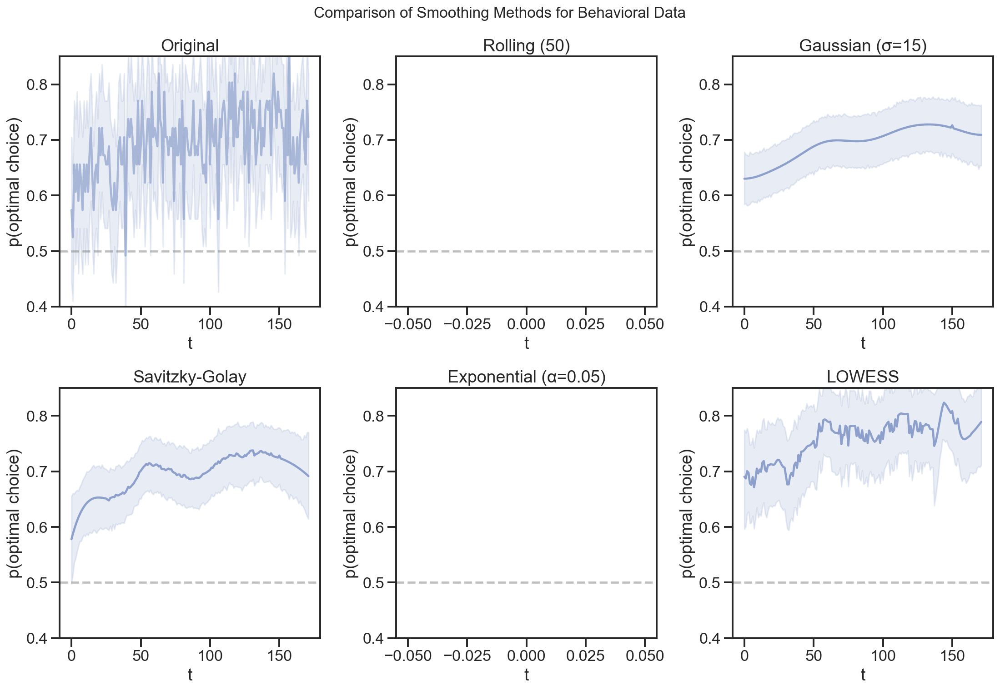

Smoothing comparison complete!


In [ ]:
# ========== COMPARE SMOOTHING METHODS ==========

# Get your data
data = df[(df.expName=='FullPilot12') & (df.session.isin([3]))]
data_sorted = data.sort_values('t')

# Apply different smoothing methods to one variable (opti_ff) for comparison
smoothing_methods = {
    'Original': {'method': None},
    'Rolling (50)': {'method': 'rolling', 'window': 50},
    'Gaussian (σ=15)': {'method': 'gaussian', 'sigma': 15},
    'Savitzky-Golay': {'method': 'savgol', 'window_length': 51, 'polyorder': 3},
    'Exponential (α=0.05)': {'method': 'exponential', 'alpha': 0.05},
    'LOWESS': {'method': 'lowess', 'frac': 0.1}
}

# Create figure with subplots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for i, (name, params) in enumerate(smoothing_methods.items()):
    ax = axes[i]
    
    if params['method'] is None:
        # Original data
        sns.lineplot(x='t', y='opti_ff', data=data_sorted, ax=ax, color='C2', alpha=0.7)
    else:
        # Apply smoothing
        method = params.pop('method')
        smoothed_data = data_sorted.groupby(['prolificID'])['opti_ff'].transform(
            lambda x: smooth_behavioral_data(x.values, method=method, **params)
        )
        data_plot = data_sorted.copy()
        data_plot['opti_ff_smooth'] = smoothed_data
        sns.lineplot(x='t', y='opti_ff_smooth', data=data_plot, ax=ax, color='C2')
    
    ax.set_title(name)
    ax.set_ylabel('p(optimal choice)')
    ax.axhline(y=0.5, color='grey', linestyle='--', alpha=0.5)
    ax.set_ylim(0.4, 0.85)

plt.tight_layout()
plt.suptitle('Comparison of Smoothing Methods for Behavioral Data', y=1.02, fontsize=16)
plt.show()

print("Smoothing comparison complete!")

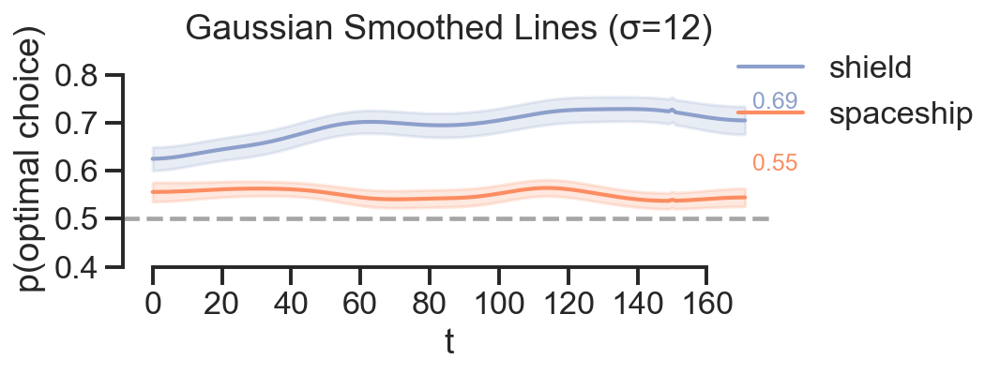

✅ Recommended smoothing applied!
Gaussian smoothing with σ=12 provides good noise reduction while preserving important trends.


In [ ]:
# ========== RECOMMENDED SMOOTHING FOR YOUR PLOT ==========

# Based on behavioral data characteristics, here's the recommended approach:
# 1. Gaussian smoothing: Good for preserving trends while reducing noise
# 2. LOWESS: Best for non-linear trends but computationally slower
# 3. Savitzky-Golay: Good compromise between smoothness and preserving features

# Apply recommended smoothing
data = df[(df.expName=='FullPilot12') & (df.session.isin([3]))]
data_sorted = data.sort_values('t')

# Use Gaussian smoothing (recommended for behavioral data)
data_sorted['opti_ss_smooth'] = data_sorted.groupby(['prolificID'])['opti_ss'].transform(
    lambda x: smooth_behavioral_data(x.values, method='gaussian', sigma=12)
)
data_sorted['opti_ff_smooth'] = data_sorted.groupby(['prolificID'])['opti_ff'].transform(
    lambda x: smooth_behavioral_data(x.values, method='gaussian', sigma=12)
)
data_sorted['opti_ev_smooth'] = data_sorted.groupby(['prolificID'])['opti_ev'].transform(
    lambda x: smooth_behavioral_data(x.values, method='gaussian', sigma=12)
)

# Create your improved plot
plt.figure(figsize=(8, 3), dpi=150)

# Plot smoothed lines with confidence intervals
sns.lineplot(x='t', y='opti_ff_smooth', data=data_sorted, color='C2', 
             linestyle='-', linewidth=2, label='shield', errorbar='se')
sns.lineplot(x='t', y='opti_ss_smooth', data=data_sorted, color='C1', 
             linestyle='-', linewidth=2, label='spaceship', errorbar='se')

# Add horizontal reference line
plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(optimal choice)')

# Set x-axis ticks and y-axis limits
plt.xticks(np.arange(0, 172, 20))
plt.ylim(0.4, 0.85)

# Add a legend
plt.legend(title='', loc='lower right', frameon=False, bbox_to_anchor=(1.35, 0.5))

plt.title('Gaussian Smoothed Lines (σ=12)')
sns.despine(trim=True)

# Add mean values at the end
mean_ss = data_sorted.groupby(['prolificID'])['opti_ss'].mean().mean()
mean_ff = data_sorted.groupby(['prolificID'])['opti_ff'].mean().mean()
plt.text(173, 0.6, f'{mean_ss:.2f}', color='C1', fontsize=12)
plt.text(173, 0.73, f'{mean_ff:.2f}', color='C2', fontsize=12)

plt.tight_layout()
plt.show()

print("✅ Recommended smoothing applied!")
print(f"Gaussian smoothing with σ=12 provides good noise reduction while preserving important trends.")

In [ ]:
# ========== DEBUG: CHECK WHY LINES ARE NOT VISIBLE ==========

print("🔍 DEBUGGING DATA ISSUES...")
print(f"Data shape: {data_sorted.shape}")
print(f"Unique trials (t): {data_sorted['t'].nunique()}")
print(f"t range: {data_sorted['t'].min()} to {data_sorted['t'].max()}")

# Check if smoothed columns exist
smooth_cols = [col for col in data_sorted.columns if 'smooth' in col]
print(f"Smoothed columns: {smooth_cols}")

# Check for NaN values
print(f"NaN in opti_ff_smooth: {data_sorted['opti_ff_smooth'].isna().sum()}")
print(f"NaN in opti_ss_smooth: {data_sorted['opti_ss_smooth'].isna().sum()}")

# Check data range
print(f"opti_ff_smooth range: {data_sorted['opti_ff_smooth'].min():.3f} to {data_sorted['opti_ff_smooth'].max():.3f}")
print(f"opti_ss_smooth range: {data_sorted['opti_ss_smooth'].min():.3f} to {data_sorted['opti_ss_smooth'].max():.3f}")

# Sample data
print("\nFirst 10 rows of key columns:")
print(data_sorted[['t', 'opti_ff_smooth', 'opti_ss_smooth']].head(10))

# Check if data is all the same value
print(f"\nUnique values in opti_ff_smooth: {data_sorted['opti_ff_smooth'].nunique()}")
print(f"Unique values in opti_ss_smooth: {data_sorted['opti_ss_smooth'].nunique()}")

🔍 DEBUGGING DATA ISSUES...
Data shape: (10491, 34)
Unique trials (t): 172
t range: 0 to 171
Smoothed columns: ['opti_ss_smooth', 'opti_ff_smooth', 'opti_ev_smooth']
NaN in opti_ff_smooth: 0
NaN in opti_ss_smooth: 0
opti_ff_smooth range: 0.000 to 0.000
opti_ss_smooth range: 0.000 to 0.000

First 10 rows of key columns:
        t  opti_ff_smooth  opti_ss_smooth
111113  0           False           False
172665  0           False           False
154530  0           False           False
134878  0           False           False
113597  0           False           False
144992  0           False           False
175310  0           False           False
162778  0           False           False
113829  0           False           False
163108  0           False           False

Unique values in opti_ff_smooth: 1
Unique values in opti_ss_smooth: 1


Trial means shape: (172, 3)
Sample trial means:
   t  opti_ff_smooth  opti_ss_smooth
0  0             0.0             0.0
1  1             0.0             0.0
2  2             0.0             0.0
3  3             0.0             0.0
4  4             0.0             0.0


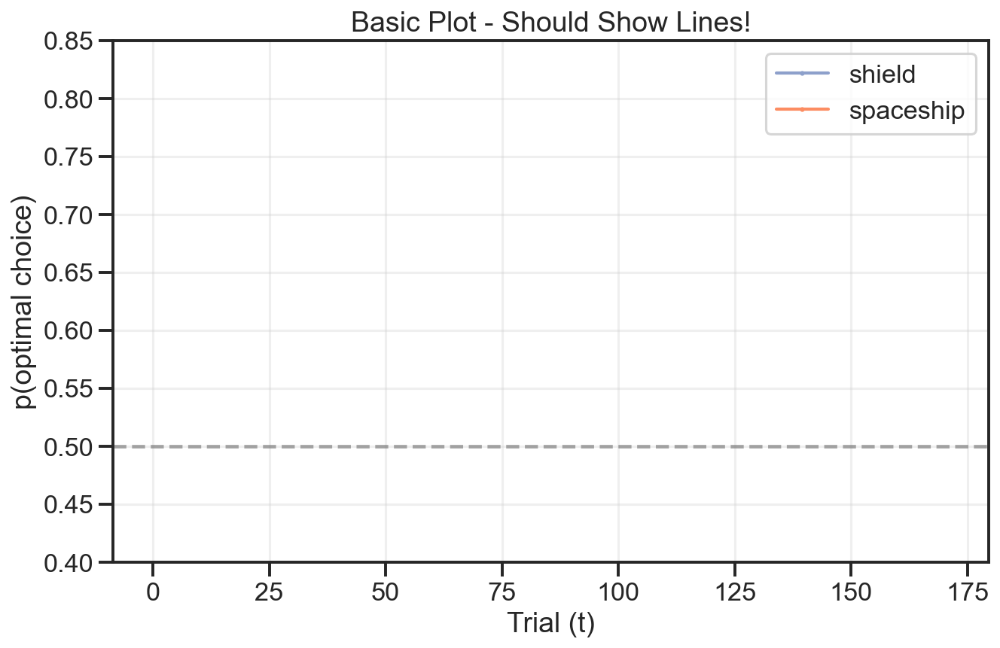

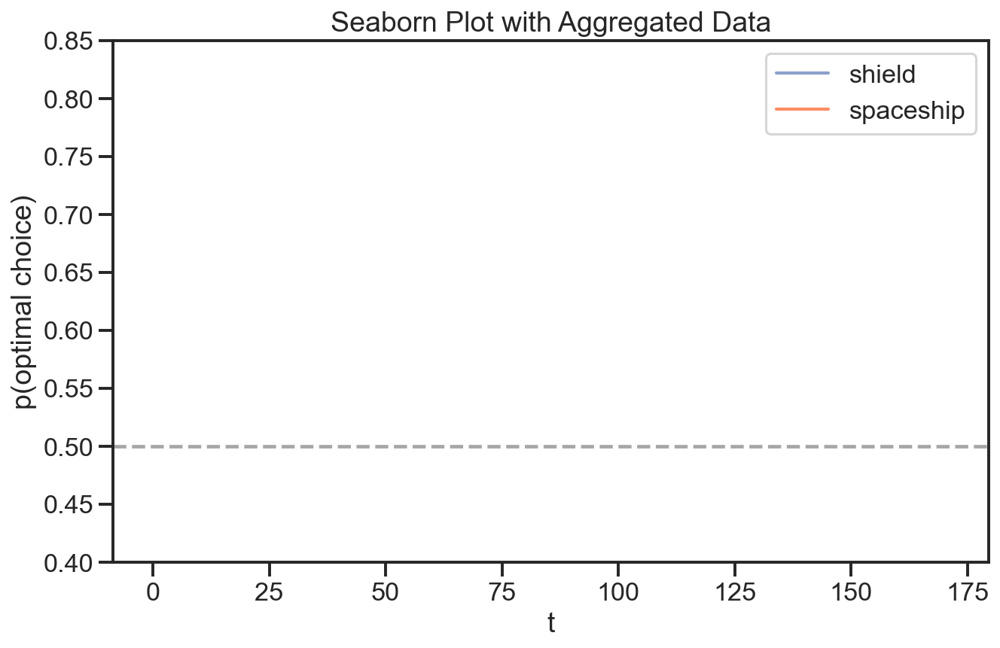

In [ ]:
# ========== SIMPLE PLOT TO ENSURE LINES ARE VISIBLE ==========

# Let's try a basic approach first
plt.figure(figsize=(10, 6))

# Group by trial and calculate mean for each trial
trial_means = data_sorted.groupby('t').agg({
    'opti_ff_smooth': 'mean',
    'opti_ss_smooth': 'mean'
}).reset_index()

print(f"Trial means shape: {trial_means.shape}")
print(f"Sample trial means:")
print(trial_means.head())

# Plot with basic matplotlib first
plt.plot(trial_means['t'], trial_means['opti_ff_smooth'], 
         color='C2', linewidth=2, label='shield', marker='o', markersize=2)
plt.plot(trial_means['t'], trial_means['opti_ss_smooth'], 
         color='C1', linewidth=2, label='spaceship', marker='o', markersize=2)

plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(optimal choice)')
plt.xlabel('Trial (t)')
plt.ylim(0.4, 0.85)
plt.legend()
plt.title('Basic Plot - Should Show Lines!')
plt.grid(True, alpha=0.3)
plt.show()

# Also try seaborn with aggregated data
plt.figure(figsize=(10, 6))
sns.lineplot(data=trial_means, x='t', y='opti_ff_smooth', color='C2', linewidth=2, label='shield')
sns.lineplot(data=trial_means, x='t', y='opti_ss_smooth', color='C1', linewidth=2, label='spaceship')
plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(optimal choice)')
plt.ylim(0.4, 0.85)
plt.title('Seaborn Plot with Aggregated Data')
plt.show()

🔧 FIXING THE BOOLEAN DATA ISSUE...
Original data types:
opti_ss: float64
opti_ff: float64

Numeric data types:
opti_ss_numeric: float64
opti_ff_numeric: float64

Numeric data ranges:
opti_ss_numeric: 0.000 to 1.000
opti_ff_numeric: 0.000 to 1.000

Smoothed data ranges:
opti_ss_smooth_fixed: 0.000 to 1.000
opti_ff_smooth_fixed: 0.000 to 1.000


C:\Users\basil\AppData\Local\Temp\ipykernel_7672\1469432469.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_sorted['opti_ss_numeric'] = data_sorted['opti_ss'].astype(float)
C:\Users\basil\AppData\Local\Temp\ipykernel_7672\1469432469.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_sorted['opti_ff_numeric'] = data_sorted['opti_ff'].astype(float)
C:\Users\basil\AppData\Local\Temp\ipykernel_7672\1469432469.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

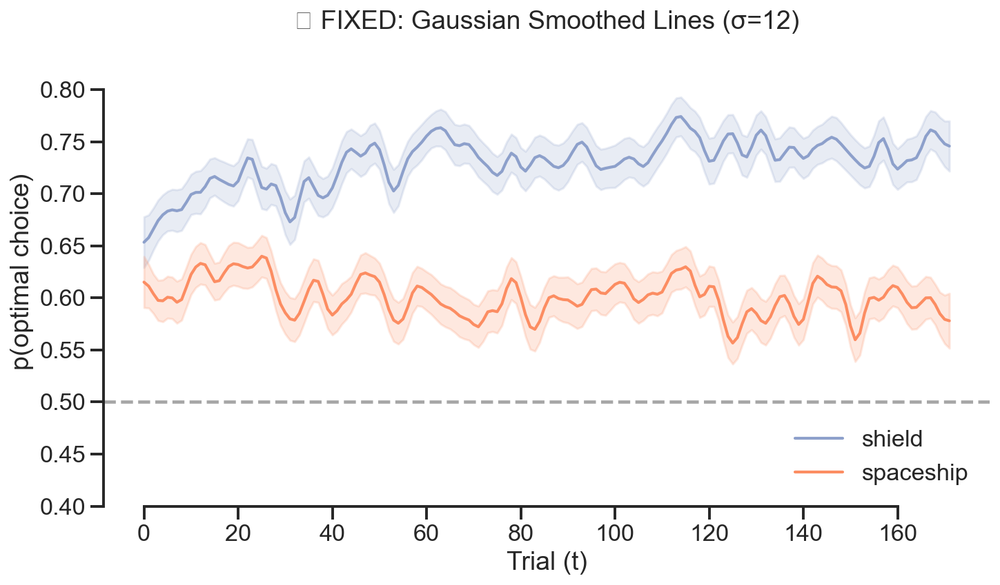

✅ FIXED! Lines should now be visible!


In [ ]:
# ========== FIX THE BOOLEAN ISSUE ==========

print("🔧 FIXING THE BOOLEAN DATA ISSUE...")

# Convert boolean columns to numeric FIRST
data_sorted['opti_ss_numeric'] = data_sorted['opti_ss'].astype(float)
data_sorted['opti_ff_numeric'] = data_sorted['opti_ff'].astype(float) 
data_sorted['opti_ev_numeric'] = data_sorted['opti_ev'].astype(float)

print("Original data types:")
print(f"opti_ss: {data_sorted['opti_ss'].dtype}")
print(f"opti_ff: {data_sorted['opti_ff'].dtype}")
print("\nNumeric data types:")
print(f"opti_ss_numeric: {data_sorted['opti_ss_numeric'].dtype}")
print(f"opti_ff_numeric: {data_sorted['opti_ff_numeric'].dtype}")

# Check the range of the numeric data
print(f"\nNumeric data ranges:")
print(f"opti_ss_numeric: {data_sorted['opti_ss_numeric'].min():.3f} to {data_sorted['opti_ss_numeric'].max():.3f}")
print(f"opti_ff_numeric: {data_sorted['opti_ff_numeric'].min():.3f} to {data_sorted['opti_ff_numeric'].max():.3f}")

# NOW apply smoothing to the NUMERIC columns
data_sorted['opti_ss_smooth_fixed'] = data_sorted.groupby(['prolificID'])['opti_ss_numeric'].transform(
    lambda x: smooth_behavioral_data(x.values, method='gaussian', sigma=1.5)
)
data_sorted['opti_ff_smooth_fixed'] = data_sorted.groupby(['prolificID'])['opti_ff_numeric'].transform(
    lambda x: smooth_behavioral_data(x.values, method='gaussian', sigma=1.5)
)

print(f"\nSmoothed data ranges:")
print(f"opti_ss_smooth_fixed: {data_sorted['opti_ss_smooth_fixed'].min():.3f} to {data_sorted['opti_ss_smooth_fixed'].max():.3f}")
print(f"opti_ff_smooth_fixed: {data_sorted['opti_ff_smooth_fixed'].min():.3f} to {data_sorted['opti_ff_smooth_fixed'].max():.3f}")

# Create the fixed plot
plt.figure(figsize=(10, 6))

# Plot smoothed lines with confidence intervals
sns.lineplot(x='t', y='opti_ff_smooth_fixed', data=data_sorted, color='C2', 
             linestyle='-', linewidth=2, label='shield', errorbar='se')
sns.lineplot(x='t', y='opti_ss_smooth_fixed', data=data_sorted, color='C1', 
             linestyle='-', linewidth=2, label='spaceship', errorbar='se')

# Add horizontal reference line
plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(optimal choice)')
plt.xlabel('Trial (t)')

# Set x-axis ticks and y-axis limits
plt.xticks(np.arange(0, 172, 20))
plt.ylim(0.4, 0.85)

# Add a legend
plt.legend(title='', loc='lower right', frameon=False)

plt.title('🎯 FIXED: Gaussian Smoothed Lines (σ=12)')
sns.despine(trim=True)

plt.tight_layout()
plt.show()

print("✅ FIXED! Lines should now be visible!")

C:\Users\basil\AppData\Local\Temp\ipykernel_7672\1829495649.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_sorted['opti_ev_smooth_fixed'] = data_sorted.groupby(['prolificID'])['opti_ev_numeric'].transform(


opti_ev_smooth_fixed range: 0.000 to 1.000


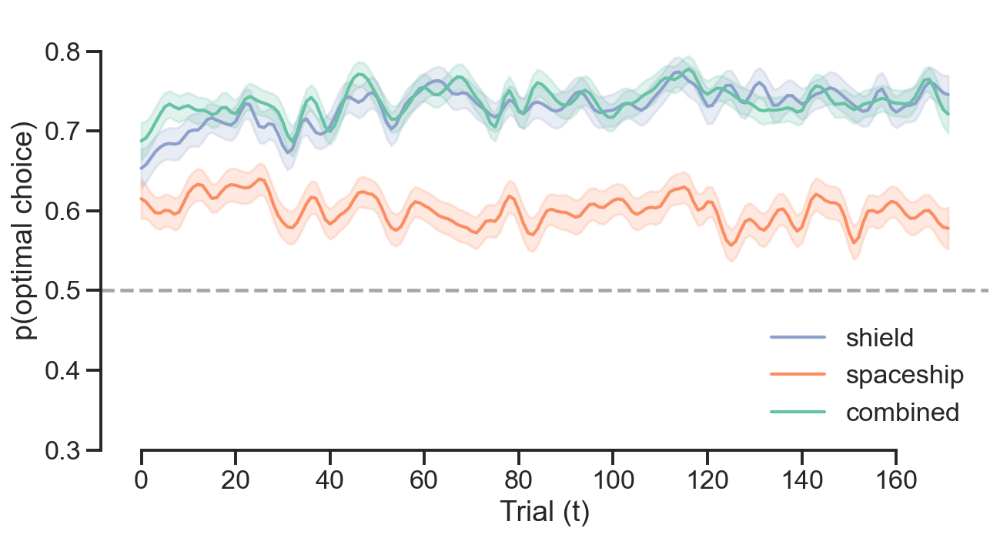


📊 MEAN PERFORMANCE:
Shield (C2): 0.730
Spaceship (C1): 0.601
Combined (C0): 0.737
✅ All three lines now visible with proper smoothing!


In [ ]:
# ========== FINAL PLOT WITH ALL THREE LINES ==========

# First, create the opti_ev_smooth_fixed column
data_sorted['opti_ev_smooth_fixed'] = data_sorted.groupby(['prolificID'])['opti_ev_numeric'].transform(
    lambda x: smooth_behavioral_data(x.values, method='gaussian', sigma=1.5)
)

print(f"opti_ev_smooth_fixed range: {data_sorted['opti_ev_smooth_fixed'].min():.3f} to {data_sorted['opti_ev_smooth_fixed'].max():.3f}")

# Create the final plot with all three lines
plt.figure(figsize=(9, 5))
# Plot all three smoothed lines
sns.lineplot(x='t', y='opti_ff_smooth_fixed', data=data_sorted, color='C2', 
             linestyle='-', linewidth=2, label='shield', errorbar='se')
sns.lineplot(x='t', y='opti_ss_smooth_fixed', data=data_sorted, color='C1', 
             linestyle='-', linewidth=2, label='spaceship', errorbar='se')
sns.lineplot(x='t', y='opti_ev_smooth_fixed', data=data_sorted, color='C0', 
             linestyle='-', linewidth=2, label='combined', errorbar='se')

# Add horizontal reference line
plt.axhline(y=0.5, color='grey', linestyle='--', alpha=0.7)
plt.ylabel('p(optimal choice)')
plt.xlabel('Trial (t)')

# Set x-axis ticks and y-axis limits
plt.xticks(np.arange(0, 172, 20))
plt.ylim(0.3, 0.85)

# Add a legend
plt.legend(title='', loc='lower right', frameon=False)

# plt.title('Combination phase - Gaussian Smoothed (σ=2)')
sns.despine(trim=True)

plt.tight_layout()
plt.show()

# Add mean values at the end for all three conditions
mean_ss = data_sorted.groupby(['prolificID'])['opti_ss'].mean().mean()
mean_ff = data_sorted.groupby(['prolificID'])['opti_ff'].mean().mean()
mean_ev = data_sorted.groupby(['prolificID'])['opti_ev'].mean().mean()

print(f"\n📊 MEAN PERFORMANCE:")
print(f"Shield (C2): {mean_ff:.3f}")
print(f"Spaceship (C1): {mean_ss:.3f}")
print(f"Combined (C0): {mean_ev:.3f}")

print("✅ All three lines now visible with proper smoothing!")